In [1]:
getwd()

[1] "/home/abrahamcanafe/PythonProjects/ECE232E/Project2"

In [2]:
##### Offline mode #####
#library(readr)
df_facebook_combined  <- read.table('facebook_combined.txt')
head(df_facebook_combined)

,V1,V2
,<int>,<int>
1,0,1
2,0,2
3,0,3
4,0,4
5,0,5
6,0,6


In [3]:
##### Online mode #####
#download.file('http://snap.stanford.edu/data/facebook_combined.txt.gz','/content/facebook_combined.txt')
#unzip(zipfile='/content/facebook_combined.txt.gz',exdir='.')
#library(readr)
#df_facebook_combined  <- read.table('/content/facebook_combined.txt')
#head(df_facebook_combined)

In [4]:
dim(df_facebook_combined)

[1] 88234     2

In [5]:
#install.packages('igraph')
#install.packages('Matrix')
#install.packages('pracma')
#install.packages('ggplot2')
library('igraph')
library('Matrix')
library('pracma')
library('ggplot2')


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union



Attaching package: ‘pracma’


The following objects are masked from ‘package:Matrix’:

    expm, lu, tril, triu




### Q1

In [6]:
set.seed(42)  

In [7]:
facebook_combined <- as.matrix(df_facebook_combined, rownames.force=NA) + 1
size(facebook_combined)
g_facebook <- graph_from_edgelist(facebook_combined, directed=F)
#g_facebook = graph_from_data_frame(df_facebook_combined, directed=F)

[1] 88234     2

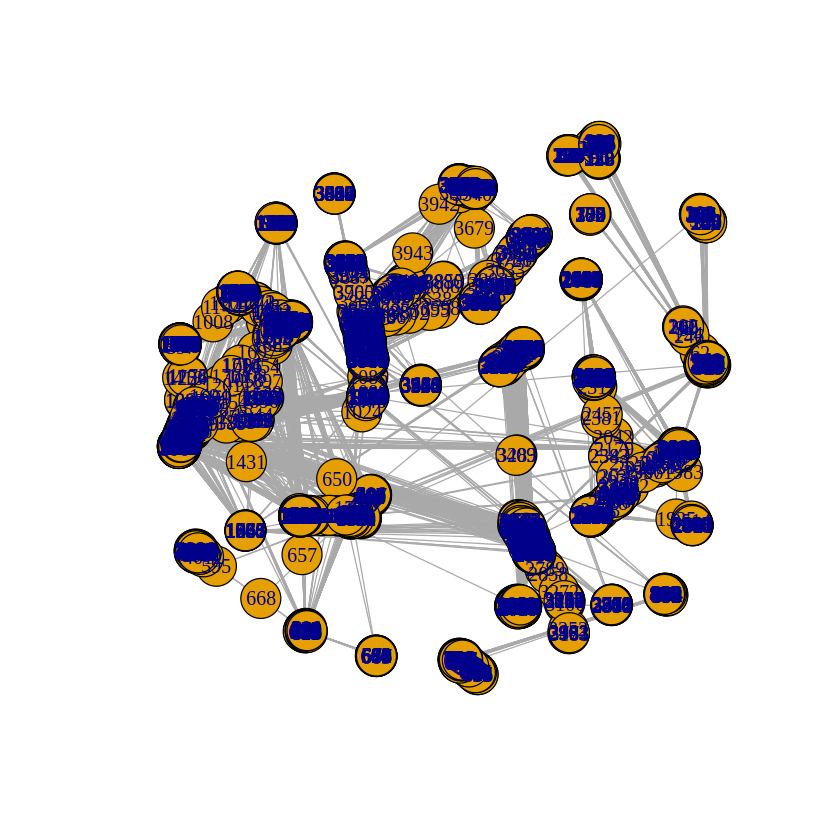

In [8]:
plot(g_facebook)

#### Q1.1

In [9]:
n_edges <- ecount(g_facebook)
n_vertices <- vcount(g_facebook)
cat('Number of edges: ', n_edges, '\n')
cat('Number of vertices: ', n_vertices)

Number of edges:  88234 
Number of vertices:  4039

#### Q1.2

In [10]:
connected_flag = is_connected(g_facebook)

if (connected_flag == TRUE) {
print('Graph is connected.')
} else {
print('Graph is not connected')
}

[1] "Graph is connected."


### Q2

In [11]:
g_diameter = diameter(g_facebook)
cat('Diameter of network: ', g_diameter)

Diameter of network:  8

### Q3

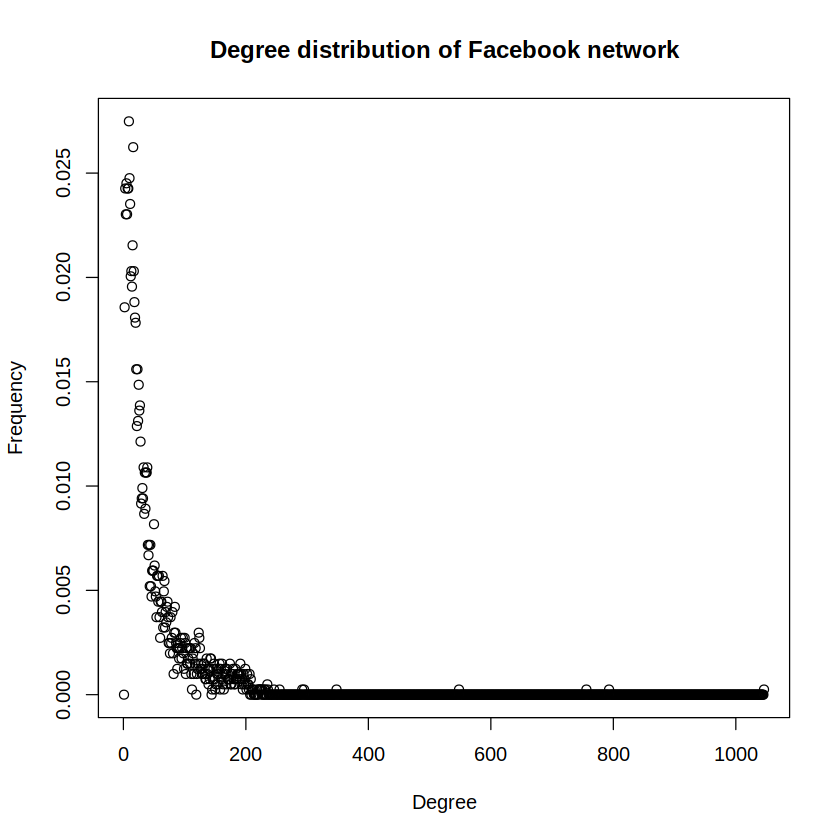

In [12]:
deg_dist_facebook = degree.distribution(g_facebook)
plot(deg_dist_facebook, main="Degree distribution of Facebook network", xlab = "Degree", ylab = "Frequency")

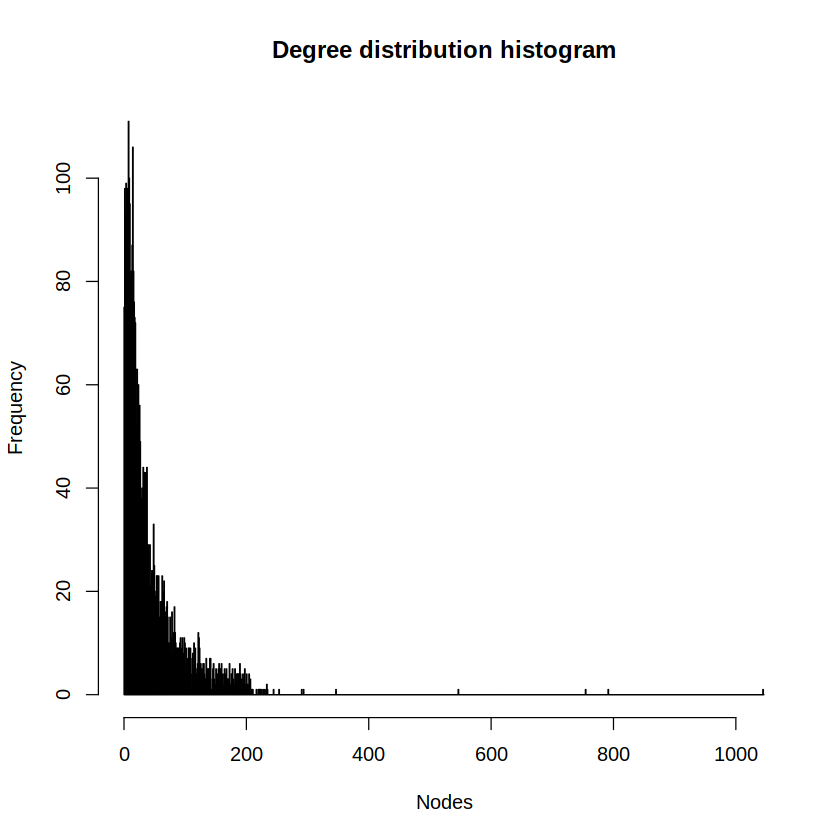

In [13]:
y <- degree(g_facebook)
hist_deg_facebook <- hist(y, breaks=seq(0.0, by=1, length.out=max(y)+2), xlab='Nodes', main='Degree distribution histogram')

In [14]:
degree_list <- degree(g_facebook)
cat('Mean degree: ', mean(degree_list)) # <--

Mean degree:  43.69101

### Q4

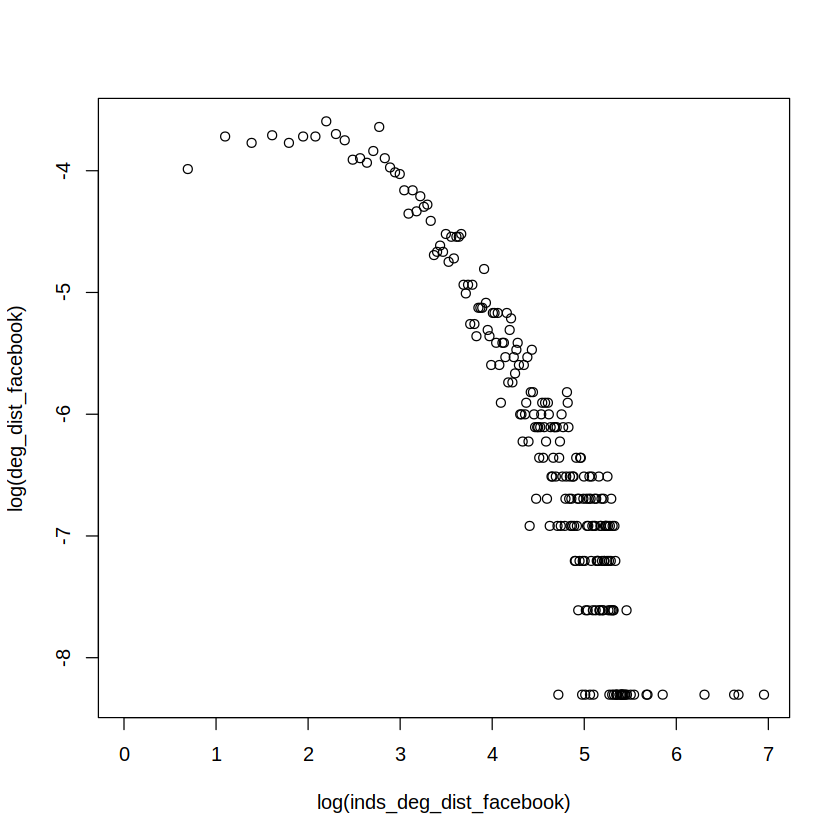

In [15]:
inds_deg_dist_facebook <- seq(length(deg_dist_facebook))
plot(log(inds_deg_dist_facebook), log(deg_dist_facebook))

In [16]:
epsilon_noise <- 1e-10
y <- c(log(deg_dist_facebook + epsilon_noise )) 
x <- c(log(inds_deg_dist_facebook + epsilon_noise)) 

max(x)
max(y)
min(x)
min(y)

[1] 6.952729

[1] -3.594222

[1] 1e-10

[1] -23.02585

In [17]:
df_facebook_distribution <- data.frame(x,y)
lm(y ~ x, data=df_facebook_distribution)


Call:
lm(formula = y ~ x, data = df_facebook_distribution)

Coefficients:
(Intercept)            x  
     14.653       -5.715  


In [18]:
ls_facebook_summary <- lm(y ~ x, data=df_facebook_distribution)

[1] "coefficients"  "residuals"     "effects"       "rank"         
 [5] "fitted.values" "assign"        "qr"            "df.residual"  
 [9] "xlevels"       "call"          "terms"         "model"

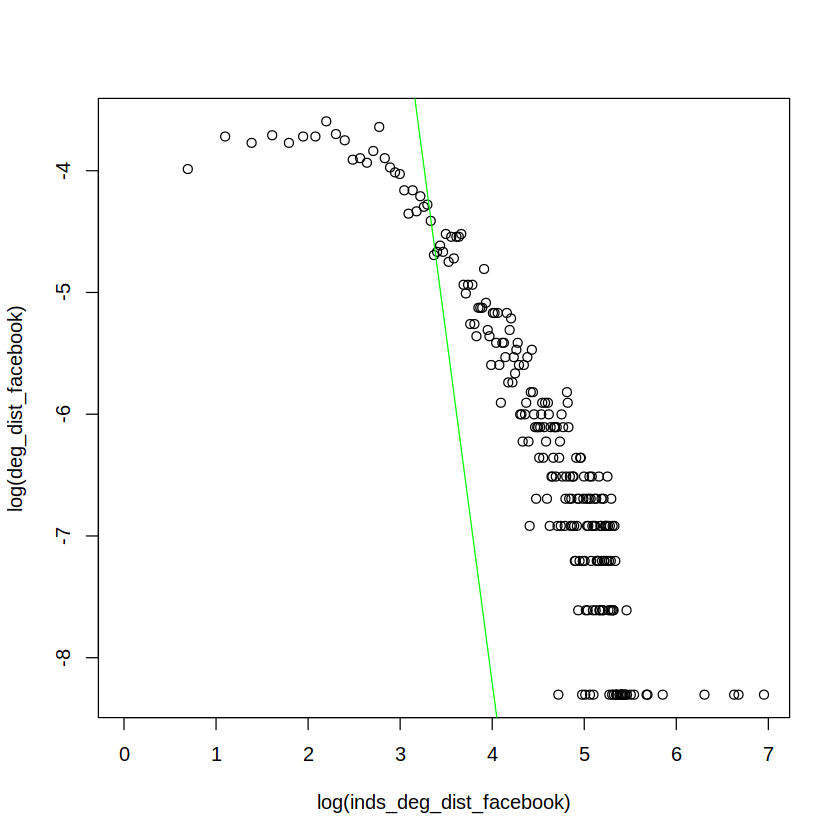

In [19]:
names(ls_facebook_summary)
fitted_log_degrees <- ls_facebook_summary[5]$fitted.values
plot(log(inds_deg_dist_facebook), log(deg_dist_facebook))
lines(log(inds_deg_dist_facebook), fitted_log_degrees, col='green')

### Q5

In [20]:
##### Fix this as needed
ego_facebook_personal_idx_1 <- make_ego_graph(g_facebook, order=1, nodes=c('1'))[[1]]

In [21]:
cat('The ego network has ', vcount(ego_facebook_personal_idx_1), ' vertices.')

The ego network has  348  vertices.

In [22]:
cat('The ego network has ', ecount(ego_facebook_personal_idx_1), ' edges.')

The ego network has  2866  edges.

### Q6

In [23]:
diameter(ego_facebook_personal_idx_1)
### Define trivial upper bound?

[1] 2

### Q7

In [24]:
# N/A

### Q8

In [25]:
dg <- degree(g_facebook)
nodes_list <- dg > 200
core_nodes <- which(nodes_list==TRUE)
no_of_core_nodes <- length(core_nodes)
avg_core_node_degree <- mean(dg[core_nodes])
cat('Average core node degree: ', avg_core_node_degree, '\n')
cat('Number of core nodes: ', no_of_core_nodes)

Average core node degree:  279.375 
Number of core nodes:  40

In [26]:
print(core_nodes)

 [1]    1  108  349  484 1087 1200 1353 1432 1585 1590 1664 1685 1731 1747 1769
[16] 1801 1828 1889 1913 1942 1986 1994 2048 2079 2124 2143 2207 2219 2230 2234
[31] 2241 2267 2348 2411 2465 2508 2544 2561 2612 3438


### Q9

In [27]:
# ======================== Nodes ======================== #
# Node ID 1
# Node ID 108
# Node ID 349
# Node ID 484
# Node ID 1087

#### Q9: Node ID 1

In [28]:
# ======================== Node ID 1 ======================== #
#ego_facebook_personal_idx_1 <- make_ego_graph(g_facebook, order=1, nodes=c('1'))[[1]]
V(g_facebook)$name <- as_ids(V(g_facebook))
core_node_remove_idx_1 = c('1')
sel_nodes <- V(g_facebook)[name %in% core_node_remove_idx_1]
sel_egoV <- ego(g_facebook, order=1, nodes=sel_nodes)
ego_facebook_personal_idx_1 <- induced_subgraph(g_facebook, unlist(sel_egoV))

In [29]:
length(ego_facebook_personal_idx_1)

[1] 348

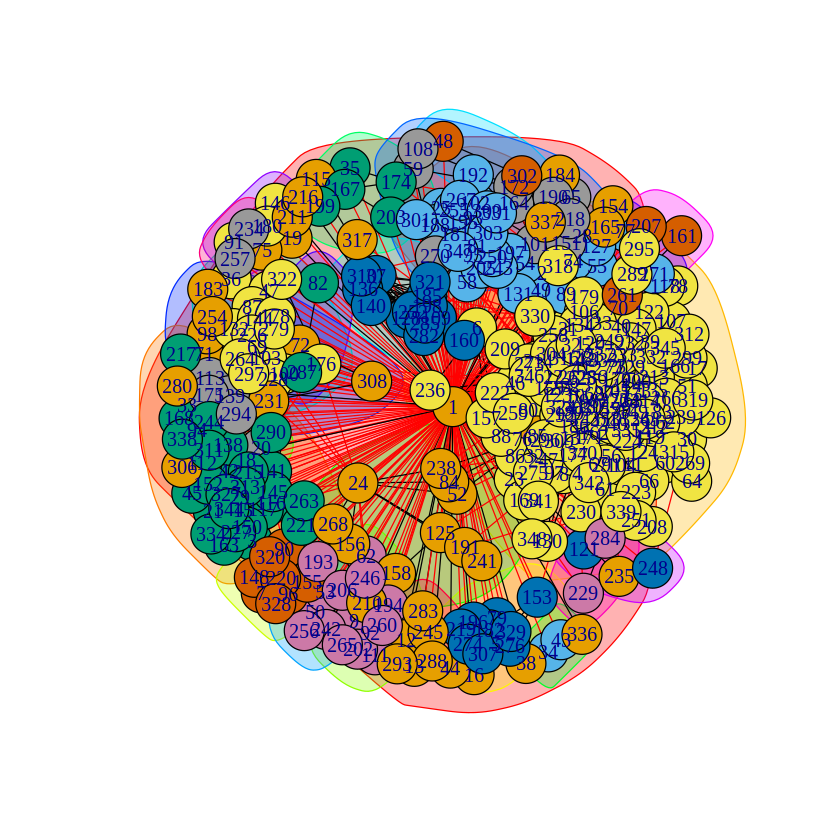

In [30]:
imc_facebook_1 <- infomap.community(ego_facebook_personal_idx_1)
plot(imc_facebook_1, ego_facebook_personal_idx_1)

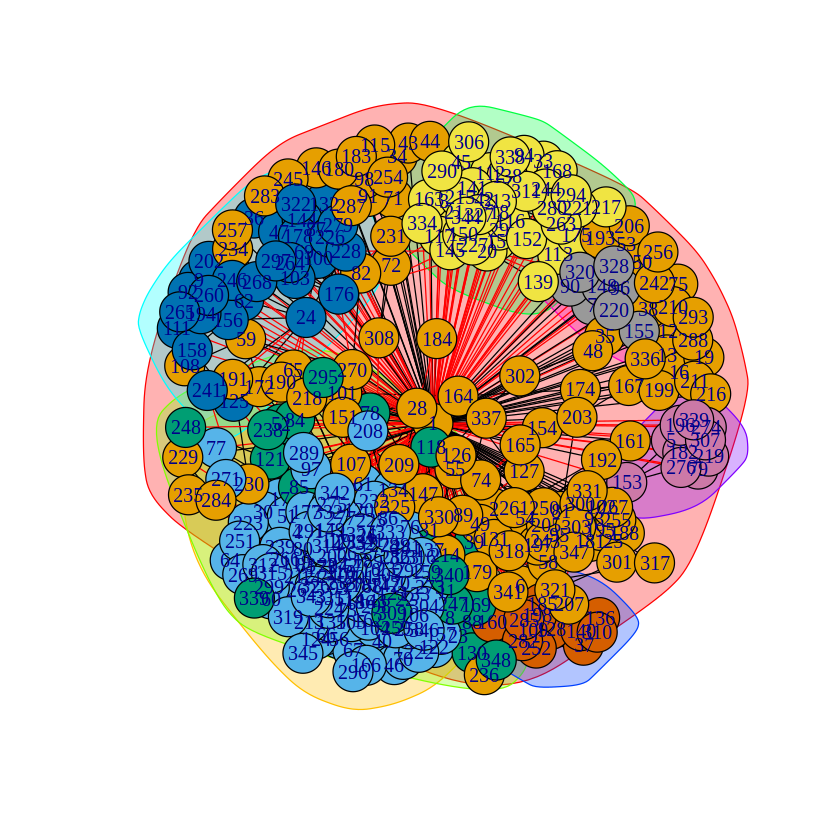

In [31]:
fgc_facebook_1 <- fastgreedy.community(ego_facebook_personal_idx_1)
plot(fgc_facebook_1, ego_facebook_personal_idx_1)

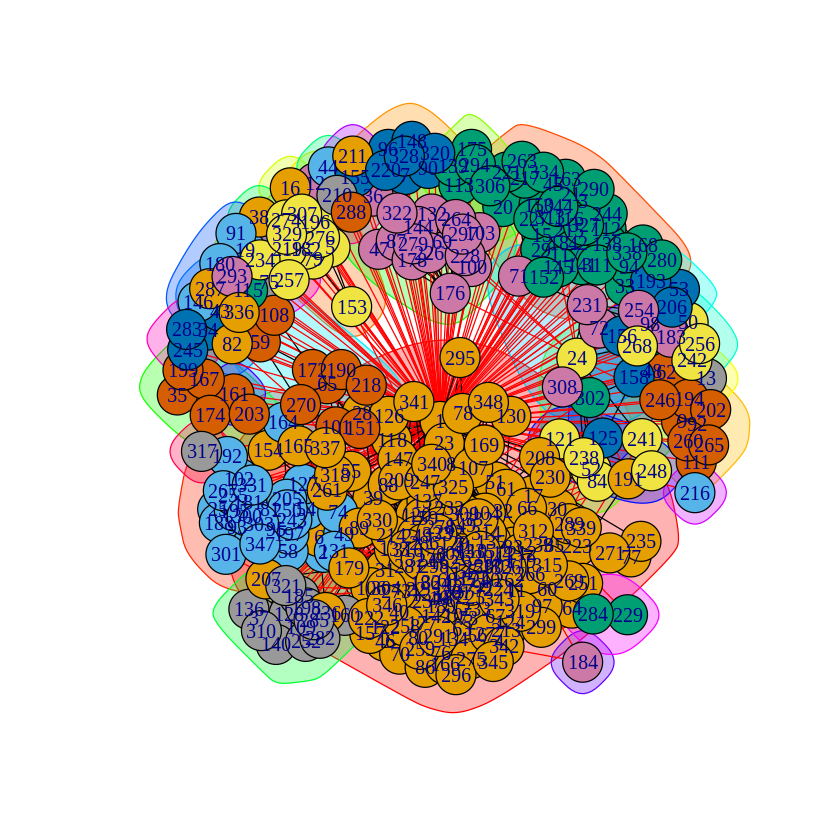

In [32]:
ebc_facebook_1 <- edge.betweenness.community(ego_facebook_personal_idx_1)
plot(ebc_facebook_1, ego_facebook_personal_idx_1)

In [33]:
##### Modularities
modularity_imc_1 <- modularity(imc_facebook_1)
modularity_fgc_1 <- modularity(fgc_facebook_1)
modularity_ebc_1 <- modularity(ebc_facebook_1)
cat('Cluster modularity of Node ID 1 using Infomap: ', modularity_imc_1, '\n')
cat('Cluster modularity of Node ID 1 using fast greedy method: ', modularity_imc_1, '\n')
cat('Cluster modularity of Node ID 1 using edge betweenness: ', modularity_ebc_1, '\n')

Cluster modularity of Node ID 1 using Infomap:  0.3941254 
Cluster modularity of Node ID 1 using fast greedy method:  0.3941254 
Cluster modularity of Node ID 1 using edge betweenness:  0.3533022 


#### Q9: Node ID 108

In [34]:
# ======================== Node ID 108 ======================== #
#ego_facebook_personal_idx_108 <- make_ego_graph(g_facebook, order=1, nodes=c('108'))[[1]]
V(g_facebook)$name <- as_ids(V(g_facebook))
core_node_remove_idx_108 = c('108')
sel_nodes <- V(g_facebook)[name %in% core_node_remove_idx_108]
sel_egoV <- ego(g_facebook, order=1, nodes=sel_nodes)
ego_facebook_personal_idx_108 <- induced_subgraph(g_facebook, unlist(sel_egoV))

In [35]:
length(ego_facebook_personal_idx_108)

[1] 1046

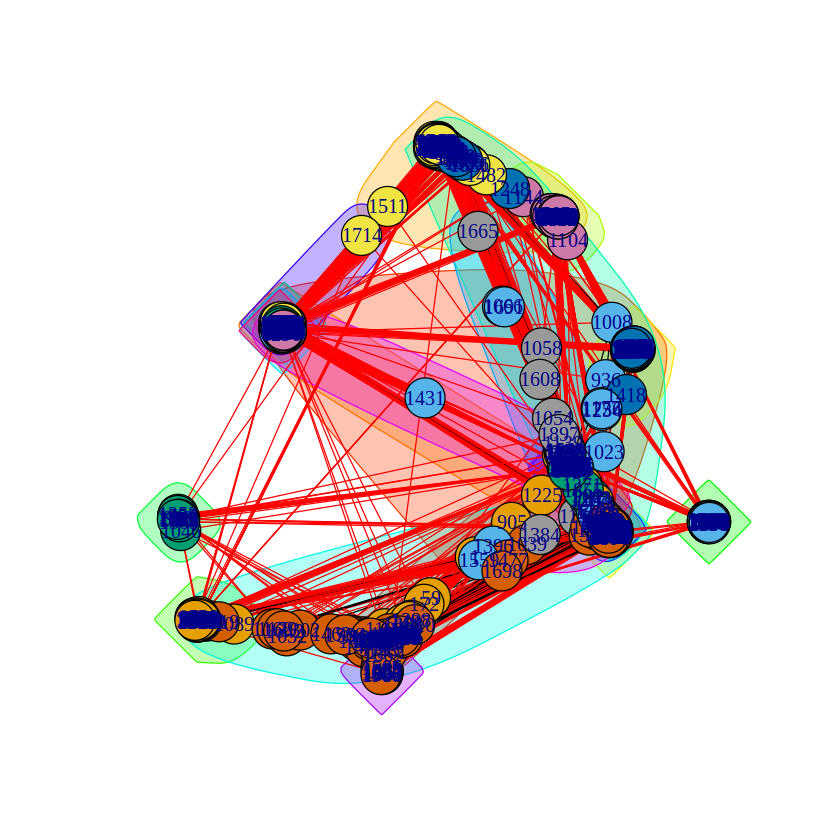

In [36]:
imc_facebook_108 <- infomap.community(ego_facebook_personal_idx_108)
plot(imc_facebook_108, ego_facebook_personal_idx_108)

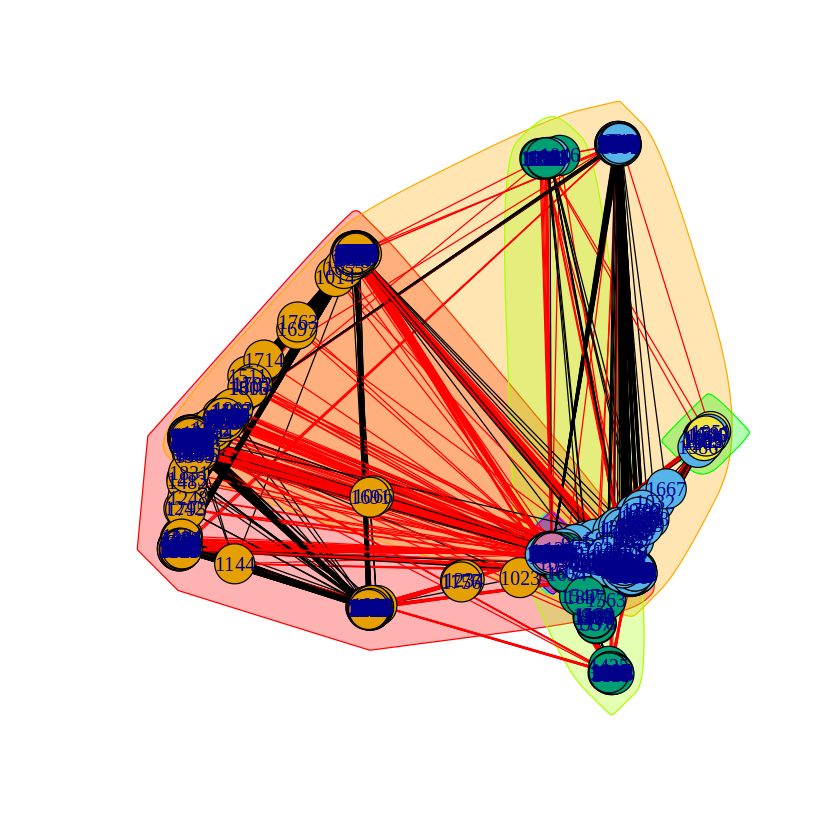

In [37]:
fgc_facebook_108 <- fastgreedy.community(ego_facebook_personal_idx_108)
plot(fgc_facebook_108, ego_facebook_personal_idx_108)

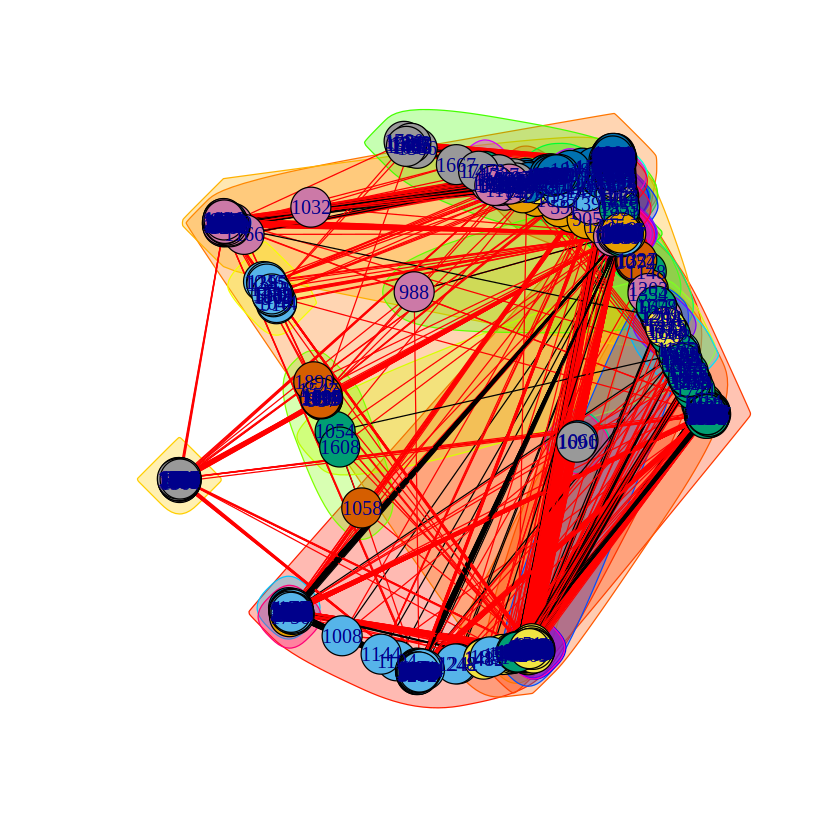

In [38]:
##### Runtime takes a while (54 minutes)
ebc_facebook_108 <- cluster_edge_betweenness(ego_facebook_personal_idx_108)
#ebc_facebook_108 <- edge.betweenness.community(ego_facebook_personal_idx_108)

plot(ebc_facebook_108, ego_facebook_personal_idx_108)

In [39]:
##### Modularities
modularity_imc_108 <- modularity(imc_facebook_108)
modularity_fgc_108 <- modularity(fgc_facebook_108)
modularity_ebc_108 <- modularity(ebc_facebook_108)
cat('Cluster modularity of Node ID 108 using Infomap: ', modularity_imc_108, '\n')
cat('Cluster modularity of Node ID 108 using fast greedy method: ', modularity_fgc_108, '\n')
cat('Cluster modularity of Node ID 108 using edge betweenness: ', modularity_ebc_108, '\n')

Cluster modularity of Node ID 108 using Infomap:  0.5082233 
Cluster modularity of Node ID 108 using fast greedy method:  0.4359294 
Cluster modularity of Node ID 108 using edge betweenness:  0.5067549 


#### Q9: Node ID 349

In [40]:
# ======================== Node ID 349 ======================== #
#ego_facebook_personal_idx_349 <- make_ego_graph(g_facebook, order=1, nodes=c('349'))[[1]]
V(g_facebook)$name <- as_ids(V(g_facebook))
core_node_remove_idx_349 = c('349')
sel_nodes <- V(g_facebook)[name %in% core_node_remove_idx_349]
sel_egoV <- ego(g_facebook, order=1, nodes=sel_nodes)
ego_facebook_personal_idx_349 <- induced_subgraph(g_facebook, unlist(sel_egoV))

In [41]:
length(ego_facebook_personal_idx_349)

[1] 230

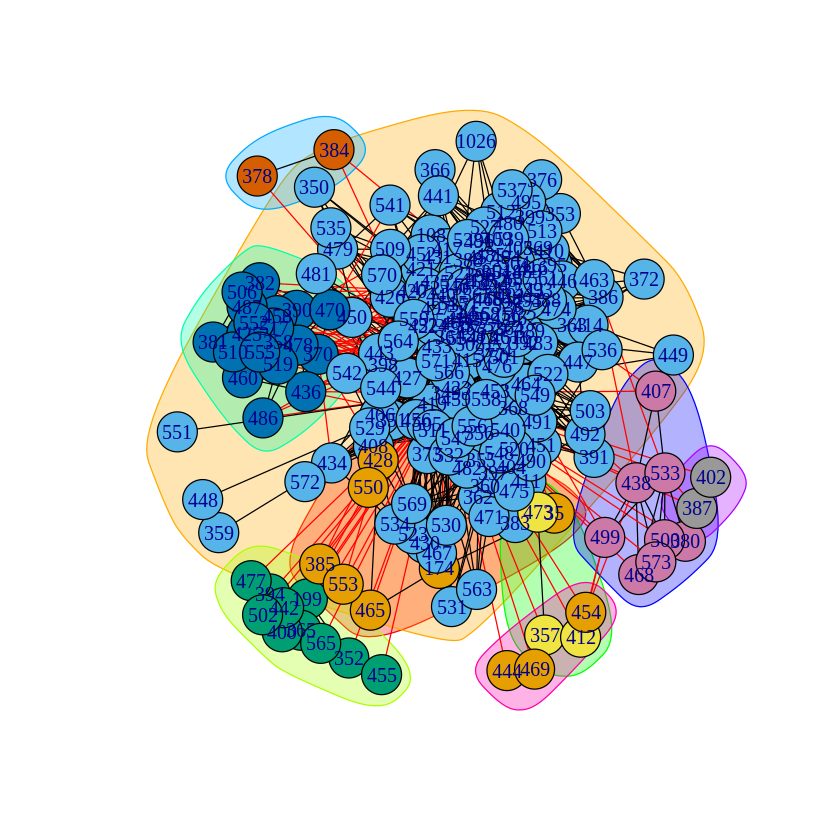

In [42]:
imc_facebook_349 <- infomap.community(ego_facebook_personal_idx_349)
plot(imc_facebook_349, ego_facebook_personal_idx_349)

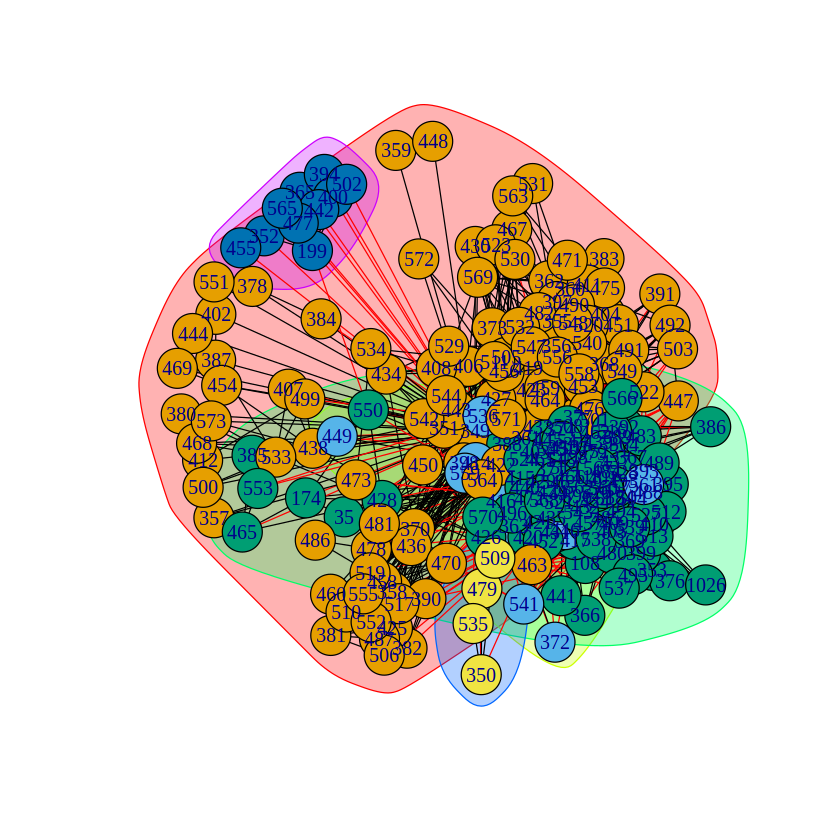

In [43]:
fgc_facebook_349 <- fastgreedy.community(ego_facebook_personal_idx_349)
plot(fgc_facebook_349, ego_facebook_personal_idx_349)

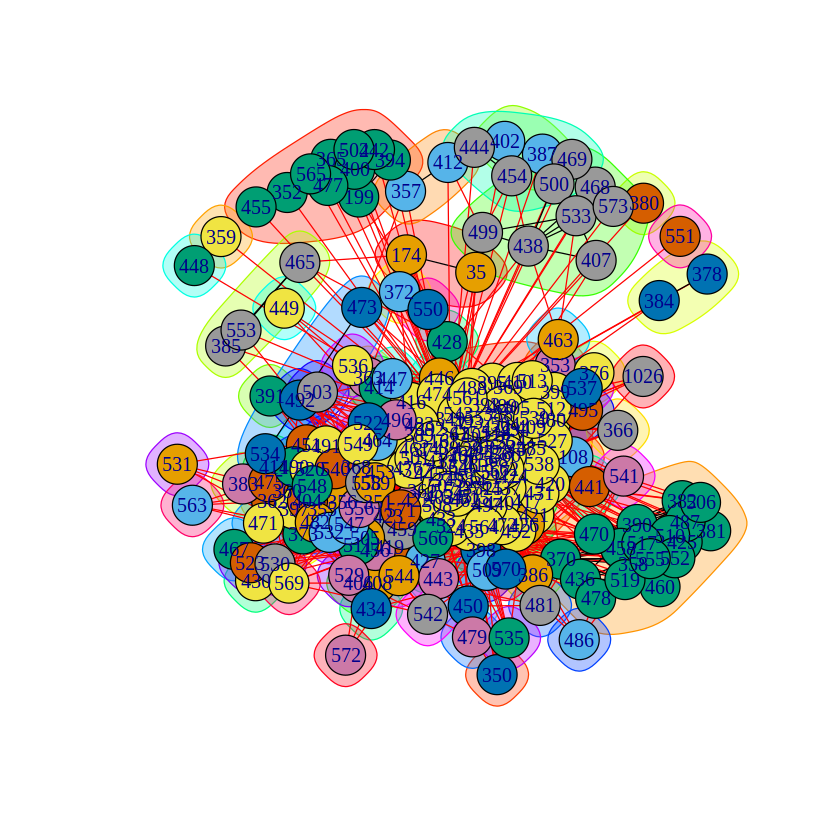

In [44]:
ebc_facebook_349 <- edge.betweenness.community(ego_facebook_personal_idx_349)
plot(ebc_facebook_349, ego_facebook_personal_idx_349)

In [45]:
##### Modularities
modularity_imc_349 <- modularity(imc_facebook_349)
modularity_fgc_349 <- modularity(fgc_facebook_349)
modularity_ebc_349 <- modularity(ebc_facebook_349)
cat('Cluster modularity of Node ID 348 using Infomap: ', modularity_imc_349, '\n')
cat('Cluster modularity of Node ID 349 using fast greedy method: ', modularity_fgc_349, '\n')
cat('Cluster modularity of Node ID 349 using edge betweenness: ', modularity_ebc_349, '\n')

Cluster modularity of Node ID 348 using Infomap:  0.0954642 
Cluster modularity of Node ID 349 using fast greedy method:  0.2517149 
Cluster modularity of Node ID 349 using edge betweenness:  0.133528 


In [46]:
modularity(fgc_facebook_349)

[1] 0.2517149

#### Q9: Node ID 484

In [47]:
# ======================== Node ID 484 ======================== #
#ego_facebook_personal_idx_484 <- make_ego_graph(g_facebook, order=1, nodes=c('484'))[[1]]
V(g_facebook)$name <- as_ids(V(g_facebook))
core_node_remove_idx_484 = c('484')
sel_nodes <- V(g_facebook)[name %in% core_node_remove_idx_484]
sel_egoV <- ego(g_facebook, order=1, nodes=sel_nodes)
ego_facebook_personal_idx_484 <- induced_subgraph(g_facebook, unlist(sel_egoV))

In [48]:
length(ego_facebook_personal_idx_484)

[1] 232

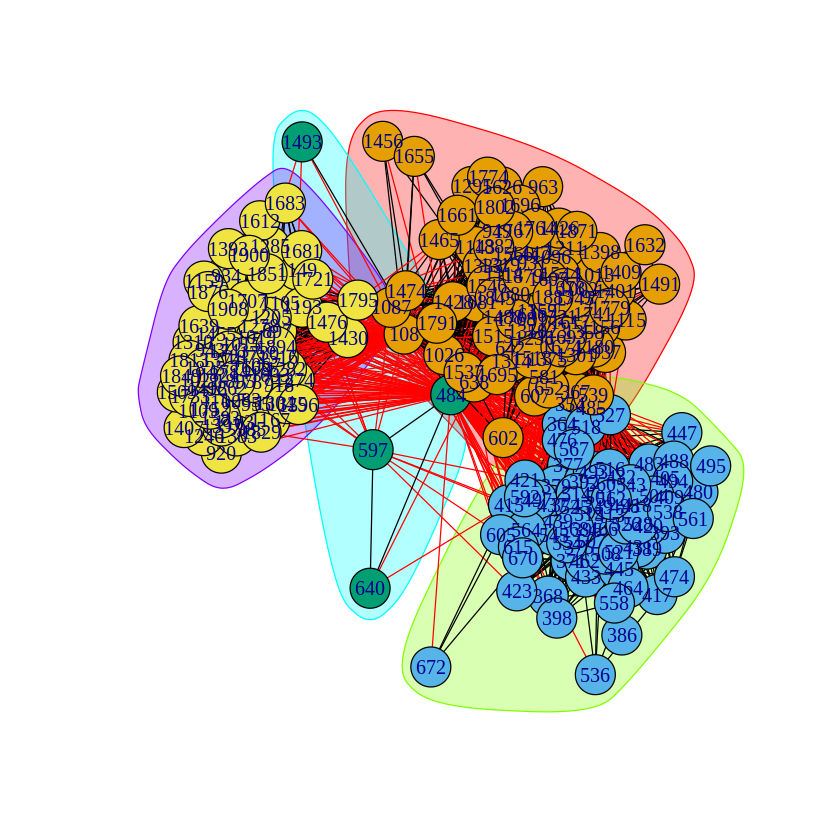

In [49]:
imc_facebook_484 <- infomap.community(ego_facebook_personal_idx_484)
plot(imc_facebook_484, ego_facebook_personal_idx_484)

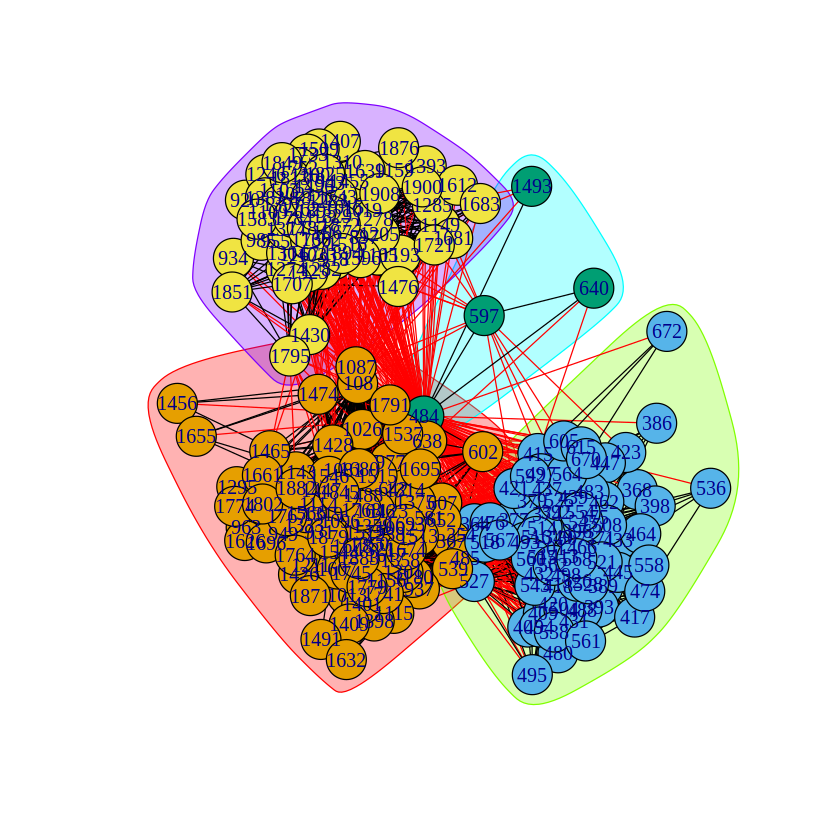

In [50]:
fgc_facebook_484 <- fastgreedy.community(ego_facebook_personal_idx_484)
plot(imc_facebook_484, ego_facebook_personal_idx_484)

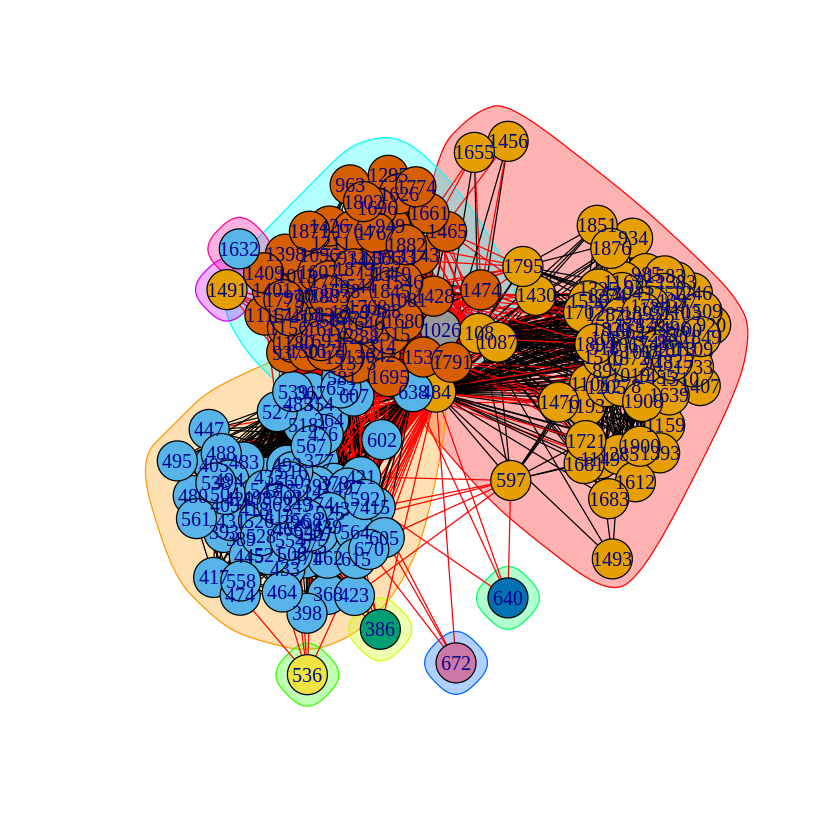

In [51]:
ebc_facebook_484 <- edge.betweenness.community(ego_facebook_personal_idx_484)
plot(ebc_facebook_484, ego_facebook_personal_idx_484)

In [52]:
##### Modularities
modularity_imc_484 <- modularity(imc_facebook_484)
modularity_fgc_484 <- modularity(fgc_facebook_484)
modularity_ebc_484 <- modularity(ebc_facebook_484)
cat('Cluster modularity of Node ID 484 using Infomap: ', modularity_imc_484, '\n')
cat('Cluster modularity of Node ID 484 using fast greedy method: ', modularity_fgc_484, '\n')
cat('Cluster modularity of Node ID 484 using edge betweenness: ', modularity_ebc_484, '\n')

Cluster modularity of Node ID 484 using Infomap:  0.5152788 
Cluster modularity of Node ID 484 using fast greedy method:  0.5070016 
Cluster modularity of Node ID 484 using edge betweenness:  0.4890952 


#### Q9: Node ID 1087

In [53]:
# ======================== Node ID 1087 ======================== #
#ego_facebook_personal_idx_1087 <- make_ego_graph(g_facebook, order=1, nodes=c('1087'))[[1]]
V(g_facebook)$name <- as_ids(V(g_facebook))
core_node_remove_idx_1087 = c('1087')
sel_nodes <- V(g_facebook)[name %in% core_node_remove_idx_1087]
sel_egoV <- ego(g_facebook, order=1, nodes=sel_nodes)
ego_facebook_personal_idx_1087 <- induced_subgraph(g_facebook, unlist(sel_egoV))

In [54]:
length(ego_facebook_personal_idx_1087)

[1] 206

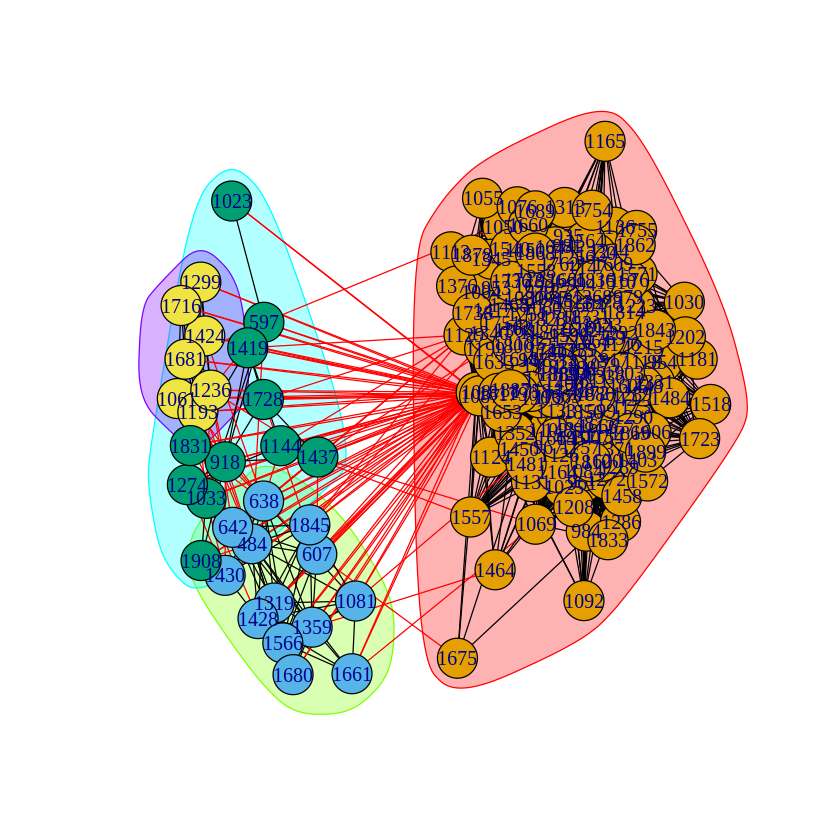

In [55]:
imc_facebook_1087 <- infomap.community(ego_facebook_personal_idx_1087)
plot(imc_facebook_1087, ego_facebook_personal_idx_1087)

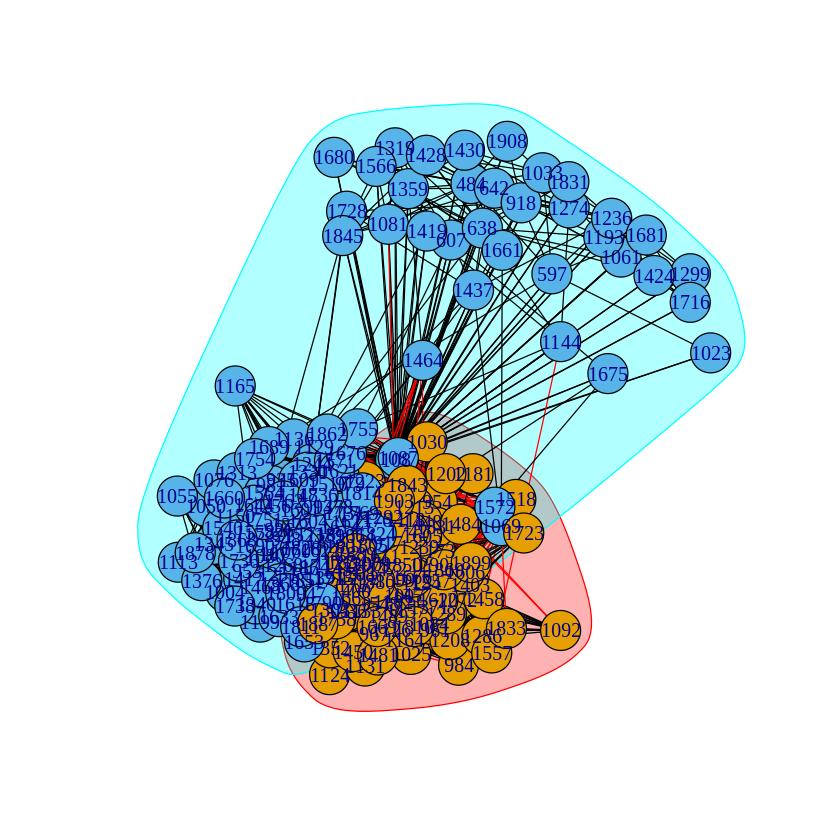

In [56]:
fgc_facebook_1087 <- fastgreedy.community(ego_facebook_personal_idx_1087)
plot(fgc_facebook_1087, ego_facebook_personal_idx_1087)

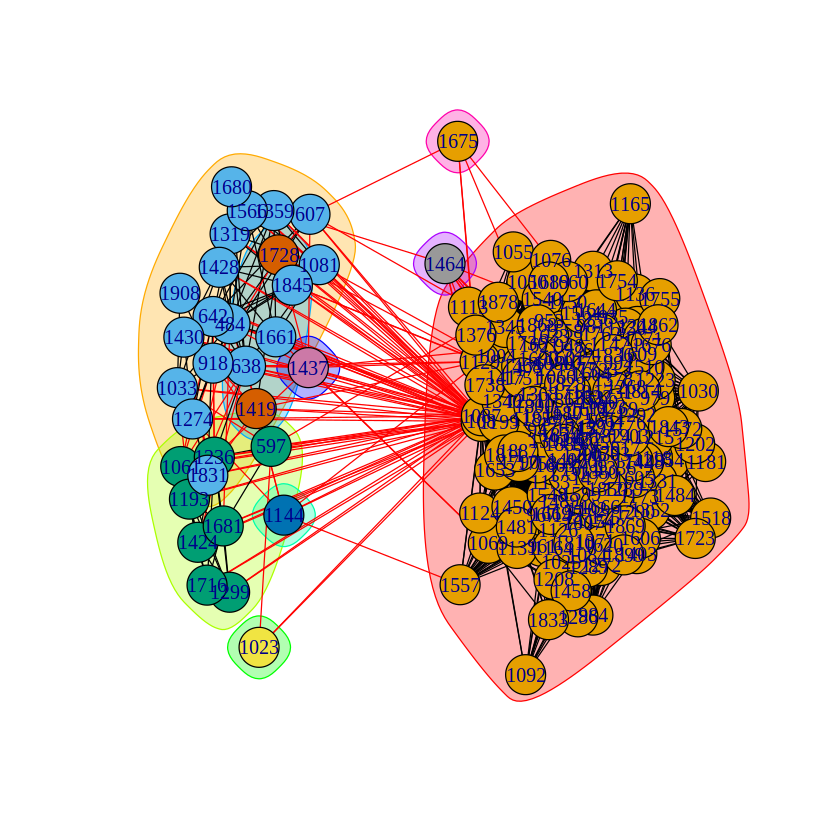

In [57]:
ebc_facebook_1087 <- edge.betweenness.community(ego_facebook_personal_idx_1087)
plot(ebc_facebook_1087, ego_facebook_personal_idx_1087)

In [58]:
##### Modularities
modularity_imc_1087 <- modularity(imc_facebook_1087)
modularity_fgc_1087 <- modularity(fgc_facebook_1087)
modularity_ebc_1087 <- modularity(ebc_facebook_1087)
cat('Cluster modularity of Node ID 1087 using Infomap: ', modularity_imc_1087, '\n')
cat('Cluster modularity of Node ID 1087 using fast greedy method: ', modularity_fgc_1087, '\n')
cat('Cluster modularity of Node ID 1087 using edge betweenness: ', modularity_ebc_1087, '\n')

Cluster modularity of Node ID 1087 using Infomap:  0.02690662 
Cluster modularity of Node ID 1087 using fast greedy method:  0.1455315 
Cluster modularity of Node ID 1087 using edge betweenness:  0.02762377 


### Q10

#### Q10: Node ID 1

In [59]:
# ======================== Remove Node ID 1 ======================== #
#removed_ego_facebook_personal_idx_1 <- ego_facebook_personal_idx_1 - c('1')
removed_ego_facebook_personal_idx_1 <- delete_vertices(ego_facebook_personal_idx_1, core_node_remove_idx_1)

In [60]:
#dg <- degree(g) nodes_list <- dg >200 core_nodes <- which(nodes_list==TRUE)


#if (core_mode ==1){ 
#    sub_graph_nocore<-sub_graph plot_mode = 1 } else{ sub_graph_nocore<-delete.vertices(sub_graph,core_node_id) plot_mode = 2 } 

In [61]:
length(removed_ego_facebook_personal_idx_1)

[1] 347

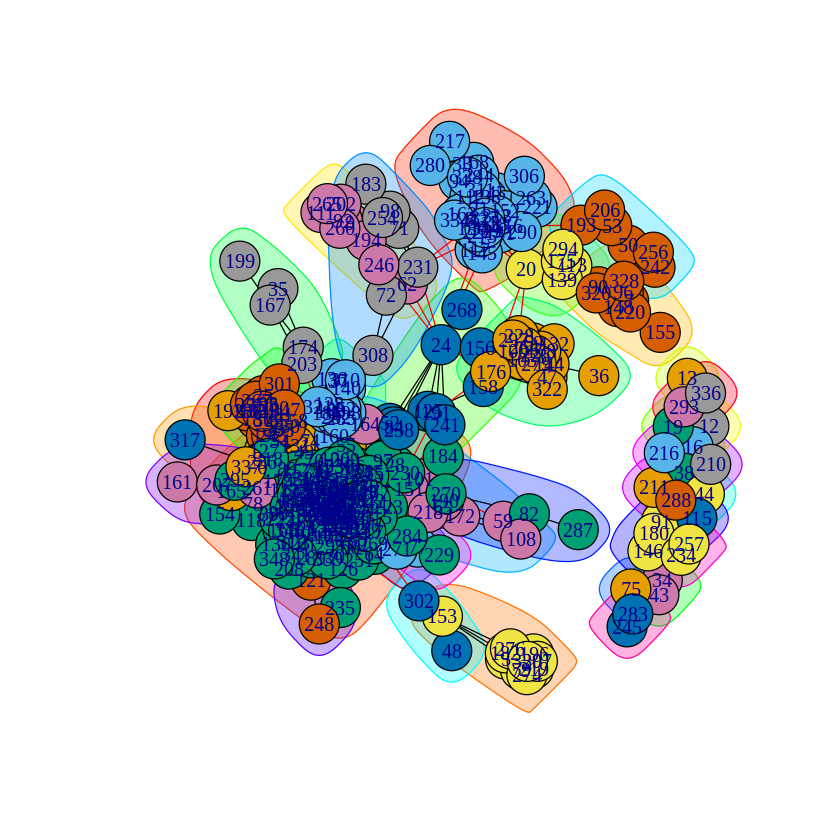

In [62]:
removed_imc_facebook_1 <- infomap.community(removed_ego_facebook_personal_idx_1)
plot(removed_imc_facebook_1, removed_ego_facebook_personal_idx_1)

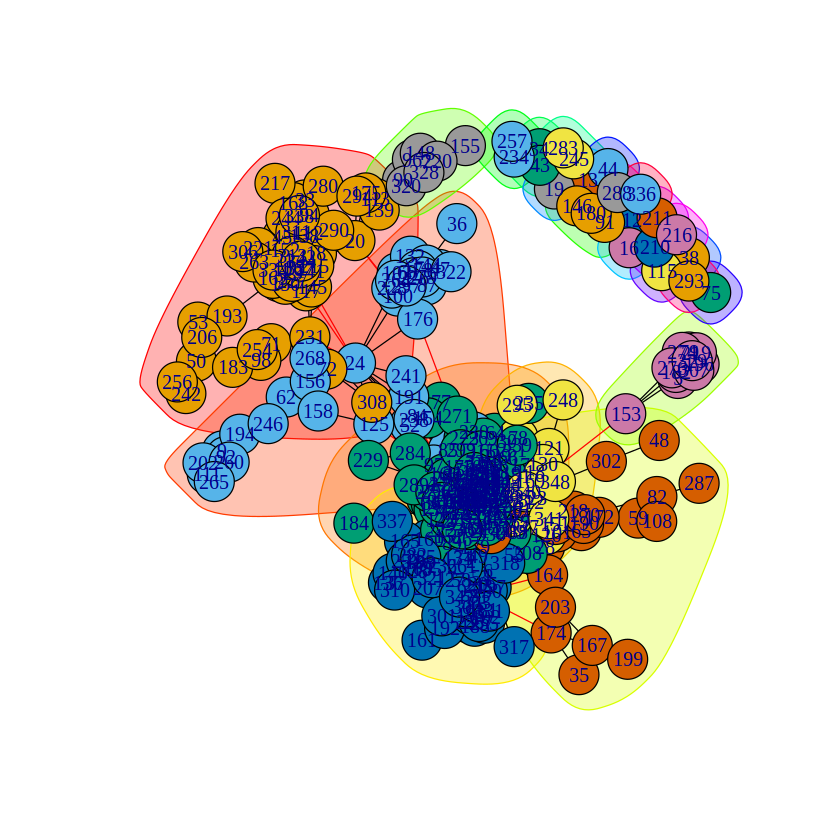

In [63]:
removed_fgc_facebook_1 <- fastgreedy.community(removed_ego_facebook_personal_idx_1)
plot(removed_fgc_facebook_1, removed_ego_facebook_personal_idx_1)

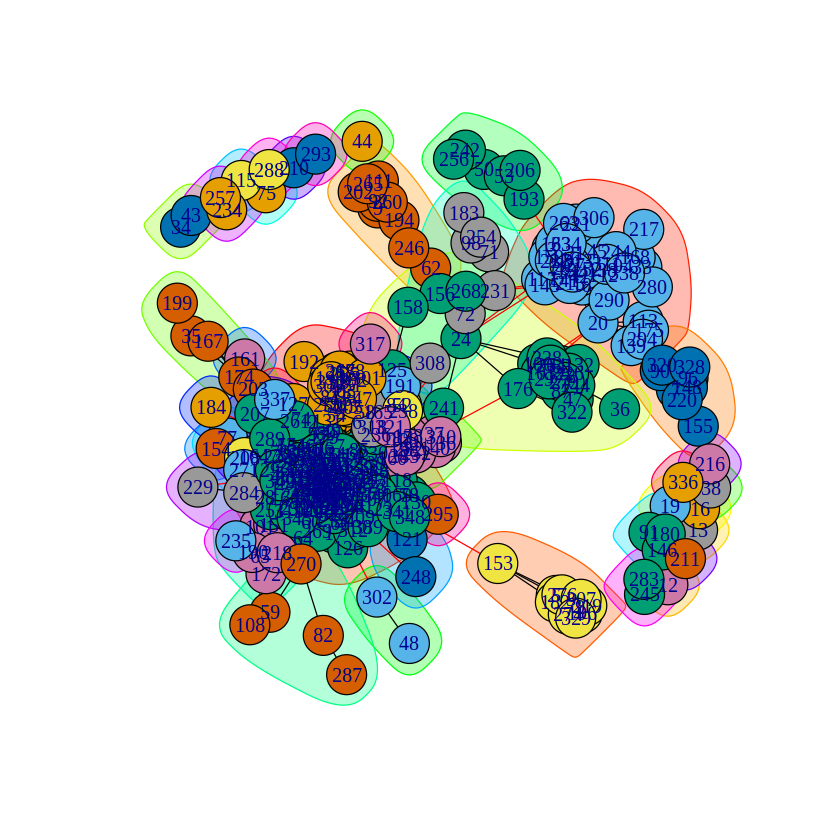

In [64]:
removed_ebc_facebook_1 <- edge.betweenness.community(removed_ego_facebook_personal_idx_1)
plot(removed_ebc_facebook_1, removed_ego_facebook_personal_idx_1)

In [65]:
##### Modularities
removed_modularity_imc_1 <- modularity(removed_imc_facebook_1)
removed_modularity_fgc_1 <- modularity(removed_fgc_facebook_1)
removed_modularity_ebc_1 <- modularity(removed_ebc_facebook_1)
cat('Cluster modularity of Removed Node ID 1 using Infomap: ', removed_modularity_imc_1, '\n')
cat('Cluster modularity of Removed Node ID 1 using fast greedy method: ', removed_modularity_fgc_1, '\n')
cat('Cluster modularity of Removed Node ID 1 using edge betweenness: ', removed_modularity_ebc_1, '\n')

Cluster modularity of Removed Node ID 1 using Infomap:  0.4180077 
Cluster modularity of Removed Node ID 1 using fast greedy method:  0.4418533 
Cluster modularity of Removed Node ID 1 using edge betweenness:  0.4161461 


#### Q10: Node ID 108

In [66]:
# ======================== Remove Node ID 108 ======================== #
#removed_ego_facebook_personal_idx_108 <- ego_facebook_personal_idx_108 - c('108')
removed_ego_facebook_personal_idx_108 <- delete_vertices(ego_facebook_personal_idx_108, core_node_remove_idx_108)

In [67]:
length(removed_ego_facebook_personal_idx_108)

[1] 1045

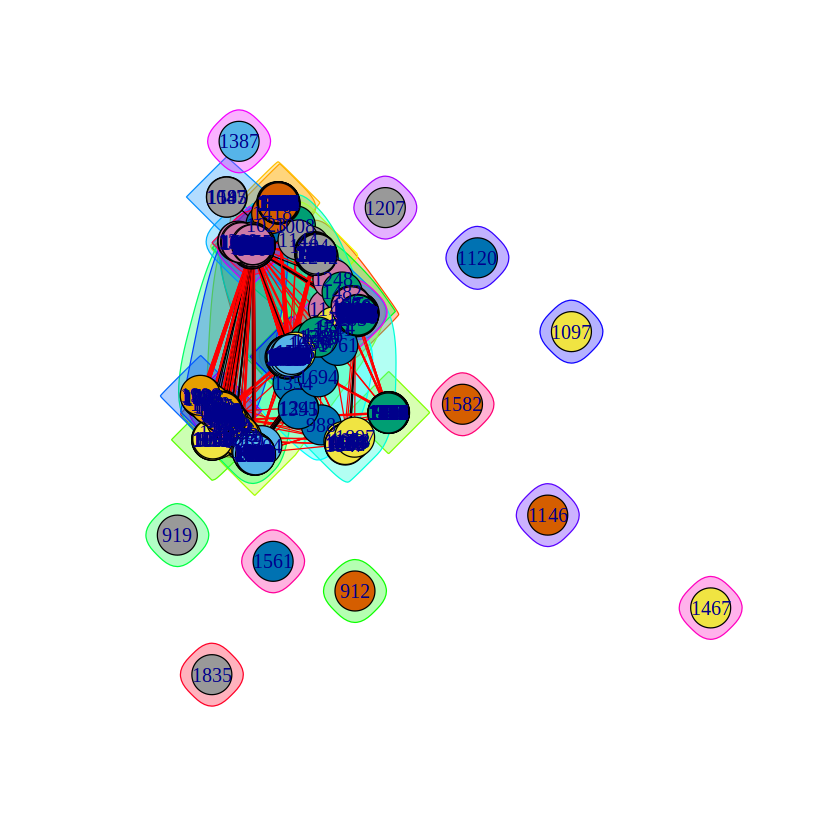

In [68]:
removed_imc_facebook_108 <- infomap.community(removed_ego_facebook_personal_idx_108)
plot(removed_imc_facebook_108, removed_ego_facebook_personal_idx_108)

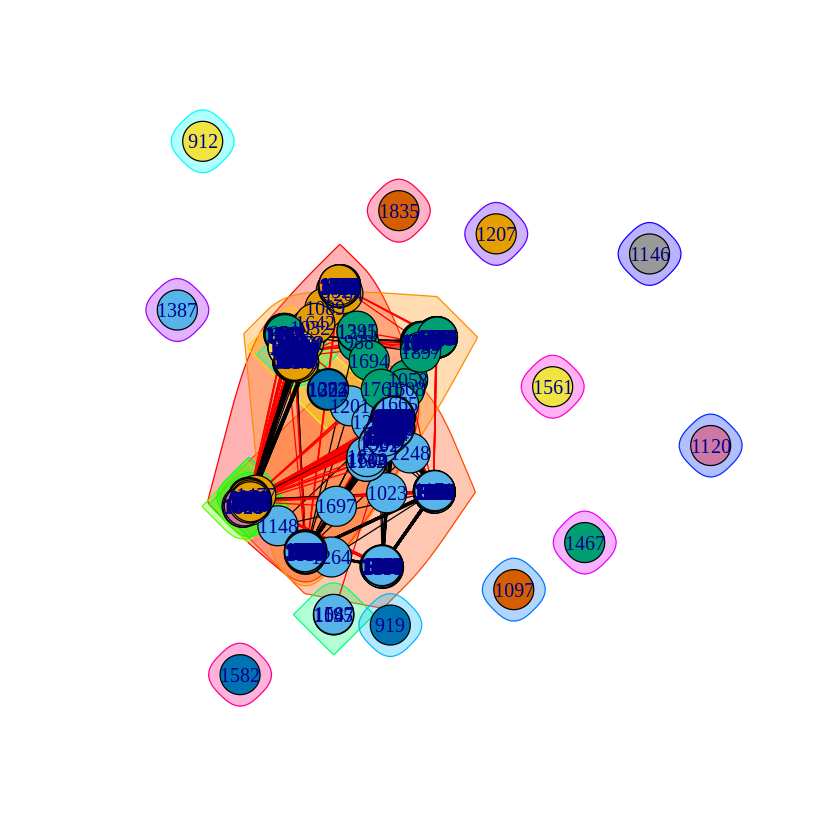

In [69]:
removed_fgc_facebook_108 <- fastgreedy.community(removed_ego_facebook_personal_idx_108)
plot(removed_fgc_facebook_108, removed_ego_facebook_personal_idx_108)

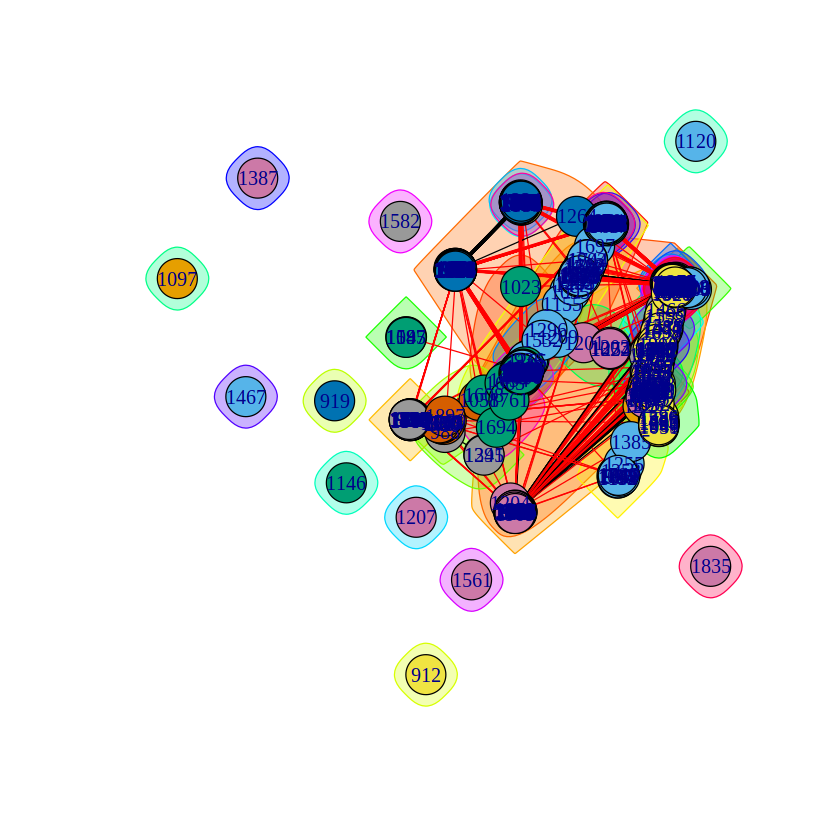

In [70]:
removed_ebc_facebook_108 <- edge.betweenness.community(removed_ego_facebook_personal_idx_108)
plot(removed_ebc_facebook_108, removed_ego_facebook_personal_idx_108)

In [71]:
##### Modularities
removed_modularity_imc_108 <- modularity(removed_imc_facebook_108)
removed_modularity_fgc_108 <- modularity(removed_fgc_facebook_108)
removed_modularity_ebc_108 <- modularity(removed_ebc_facebook_108)
cat('Cluster modularity of Removed Node ID 108 using Infomap: ', removed_modularity_imc_108, '\n')
cat('Cluster modularity of Removed Node ID 108 using fast greedy method: ', removed_modularity_fgc_108, '\n')
cat('Cluster modularity of Removed Node ID 108 using edge betweenness: ', removed_modularity_ebc_108, '\n')

Cluster modularity of Removed Node ID 108 using Infomap:  0.5205171 
Cluster modularity of Removed Node ID 108 using fast greedy method:  0.4581271 
Cluster modularity of Removed Node ID 108 using edge betweenness:  0.5213216 


#### Q10: Node ID 349

In [72]:
# ======================== Remove Node ID 349 ======================== #
# Does c('349') exist in the personalized graph??
removed_ego_facebook_personal_idx_349 <- delete_vertices(ego_facebook_personal_idx_349, core_node_remove_idx_349)

In [73]:
length(removed_ego_facebook_personal_idx_349)

[1] 229

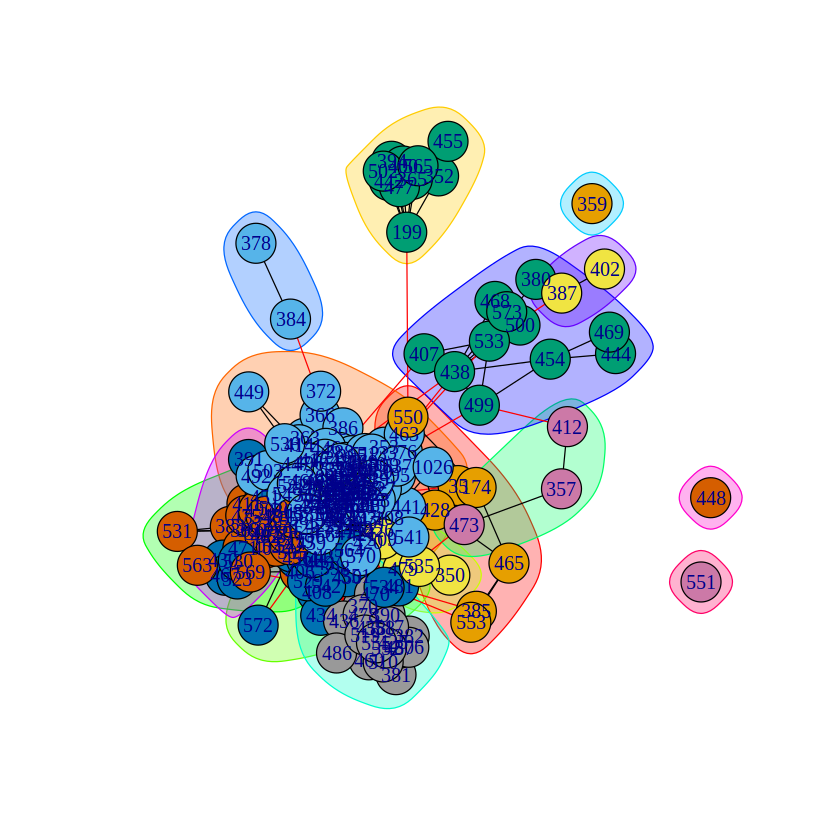

In [74]:
removed_imc_facebook_349 <- infomap.community(removed_ego_facebook_personal_idx_349)
plot(removed_imc_facebook_349, removed_ego_facebook_personal_idx_349)

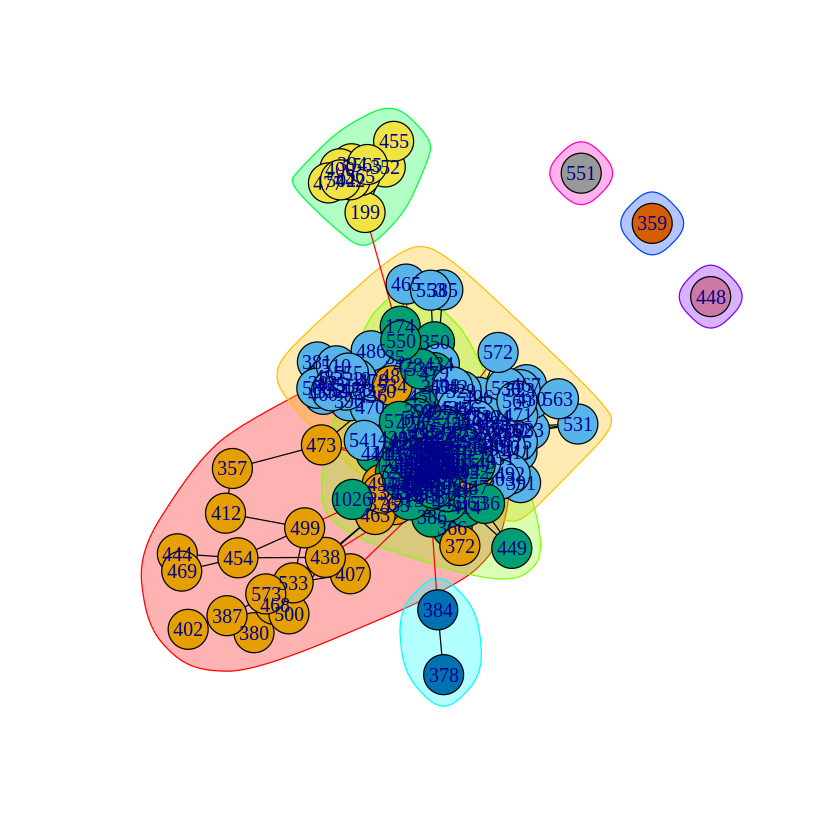

In [75]:
removed_fgc_facebook_349 <- fastgreedy.community(removed_ego_facebook_personal_idx_349)
plot(removed_fgc_facebook_349, removed_ego_facebook_personal_idx_349)

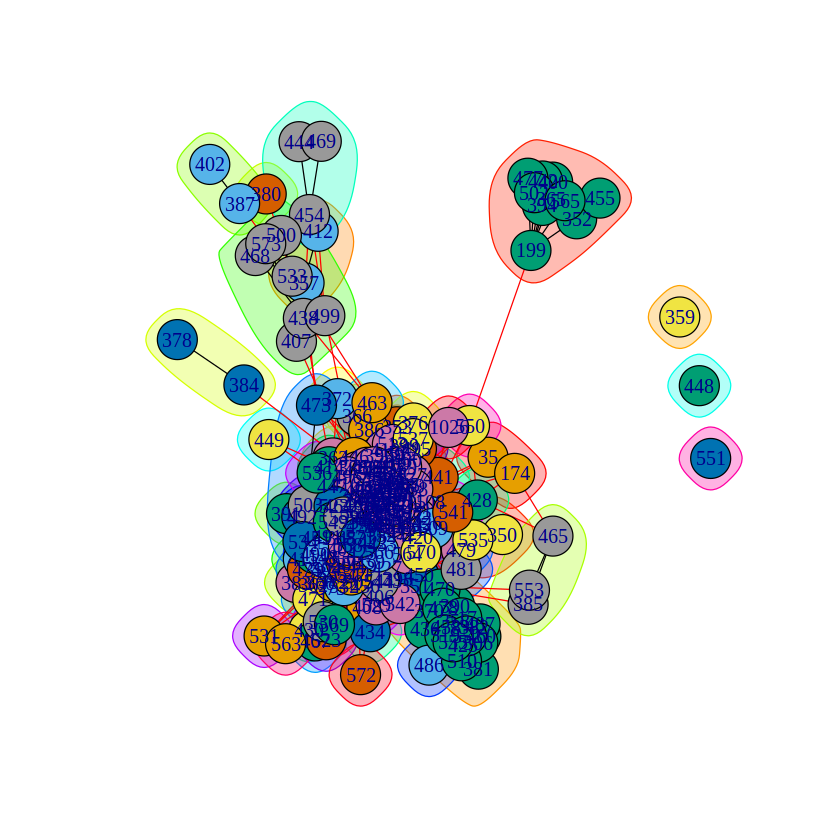

In [76]:
removed_ebc_facebook_349 <- edge.betweenness.community(removed_ego_facebook_personal_idx_349)
plot(removed_ebc_facebook_349, removed_ego_facebook_personal_idx_349)

In [77]:
##### Modularities
removed_modularity_imc_349 <- modularity(removed_imc_facebook_349)
removed_modularity_fgc_349 <- modularity(removed_fgc_facebook_349)
removed_modularity_ebc_349 <- modularity(removed_ebc_facebook_349)
cat('Cluster modularity of Removed Node ID 349 using Infomap: ', removed_modularity_imc_349, '\n')
cat('Cluster modularity of Removed Node ID 349 using fast greedy method: ', removed_modularity_fgc_349, '\n')
cat('Cluster modularity of Removed Node ID 349 using edge betweenness: ', removed_modularity_ebc_349, '\n')

Cluster modularity of Removed Node ID 349 using Infomap:  0.2448156 
Cluster modularity of Removed Node ID 349 using fast greedy method:  0.2456918 
Cluster modularity of Removed Node ID 349 using edge betweenness:  0.1505663 


#### Q10: Node ID 484

In [78]:
# ======================== Remove Node ID 484 ======================== #
# Does c('484') exist in the personalized graph??
removed_ego_facebook_personal_idx_484 <- delete_vertices(ego_facebook_personal_idx_484, core_node_remove_idx_484)

In [79]:
length(removed_ego_facebook_personal_idx_484)

[1] 231

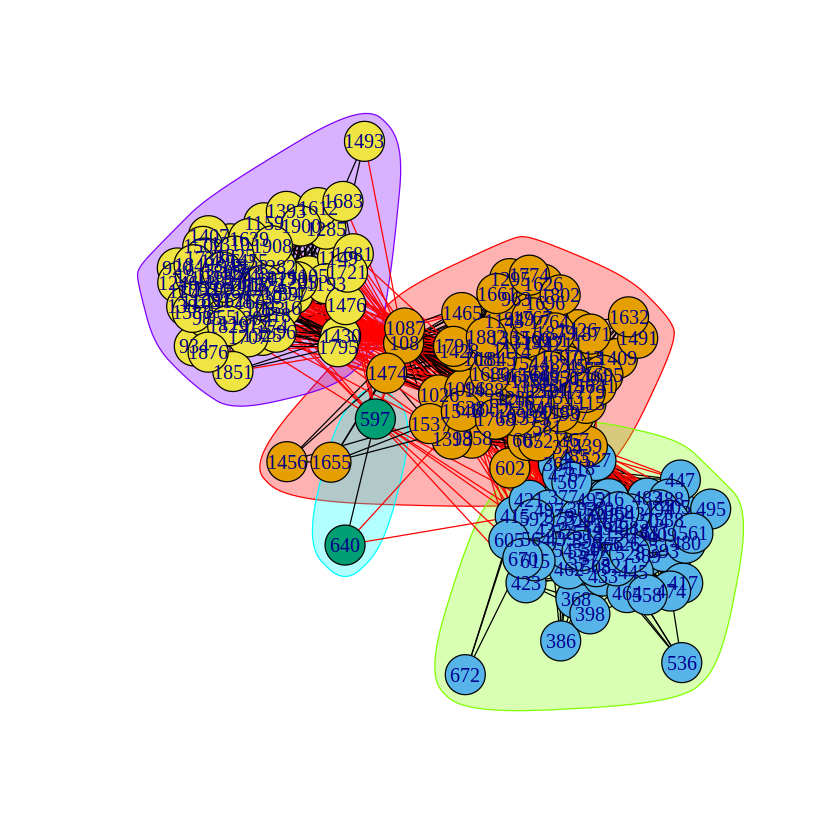

In [80]:
removed_imc_facebook_484 <- infomap.community(removed_ego_facebook_personal_idx_484)
plot(removed_imc_facebook_484, removed_ego_facebook_personal_idx_484)

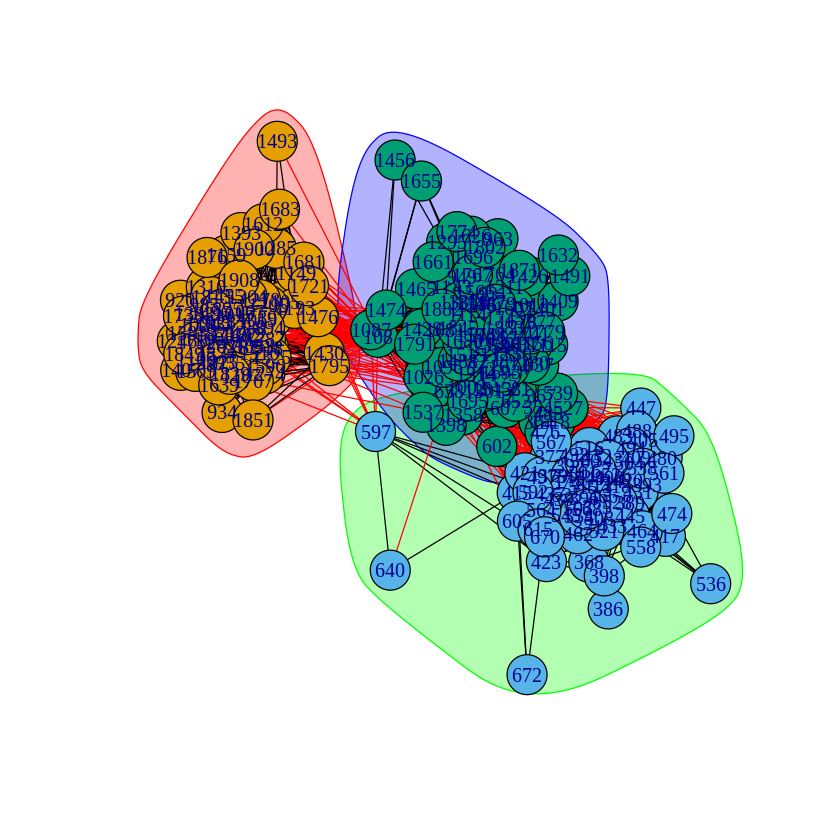

In [81]:
removed_fgc_facebook_484 <- fastgreedy.community(removed_ego_facebook_personal_idx_484)
plot(removed_fgc_facebook_484, removed_ego_facebook_personal_idx_484)

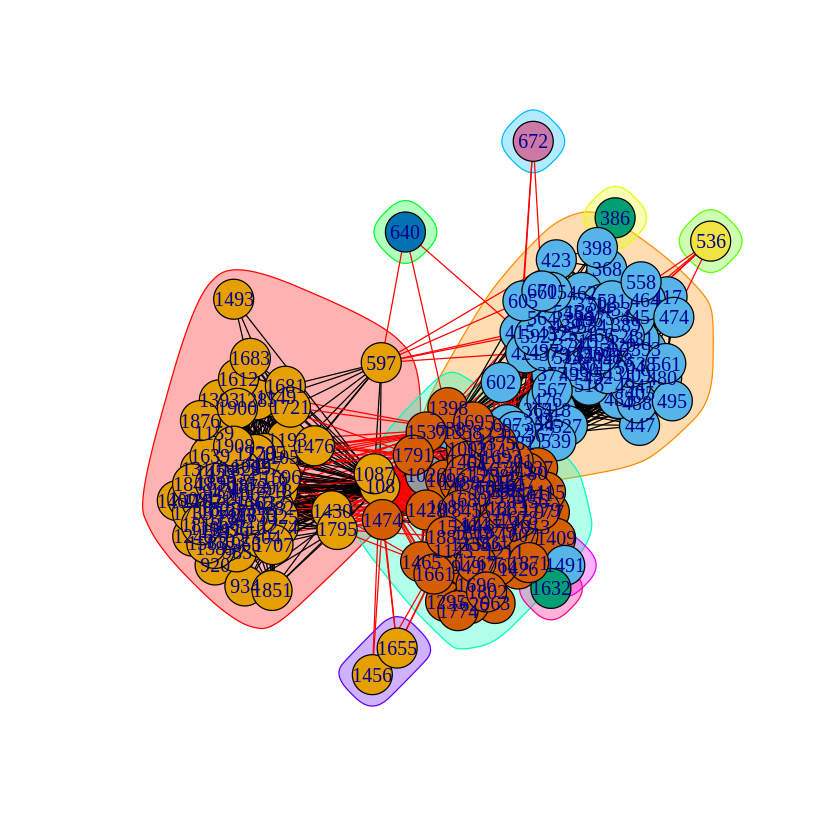

In [82]:
removed_ebc_facebook_484 <- edge.betweenness.community(removed_ego_facebook_personal_idx_484)
plot(removed_ebc_facebook_484, removed_ego_facebook_personal_idx_484)

In [83]:
##### Modularities
removed_modularity_imc_484 <- modularity(removed_imc_facebook_484)
removed_modularity_fgc_484 <- modularity(removed_fgc_facebook_484)
removed_modularity_ebc_484 <- modularity(removed_ebc_facebook_484)
cat('Cluster modularity of Removed Node ID 484 using Infomap: ', removed_modularity_imc_484, '\n')
cat('Cluster modularity of Removed Node ID 484 using fast greedy method: ', removed_modularity_fgc_484, '\n')
cat('Cluster modularity of Removed Node ID 484 using edge betweenness: ', removed_modularity_ebc_484, '\n')

Cluster modularity of Removed Node ID 484 using Infomap:  0.5434437 
Cluster modularity of Removed Node ID 484 using fast greedy method:  0.5342142 
Cluster modularity of Removed Node ID 484 using edge betweenness:  0.5154413 


#### Q10: Node ID 1087

In [84]:
# ======================== Remove Node ID 1087 ======================== #
# Does c('1087') exist in the personalized graph??

#removed_ego_facebook_personal_idx_1087 <- 0
#if (sum(V(ego_facebook_personal_idx_1087)==1087)==1) {
#  removed_ego_facebook_personal_idx_1087 <- ego_facebook_personal_idx_1087 - c('1087')
#} else {
#  removed_ego_facebook_personal_idx_1087 <- ego_facebook_personal_idx_1087
#  print('Node ID 1087 is not in subgraph.')
#}


removed_ego_facebook_personal_idx_1087 <- delete_vertices(ego_facebook_personal_idx_1087, core_node_remove_idx_1087)

In [85]:
length(removed_ego_facebook_personal_idx_1087)

[1] 205

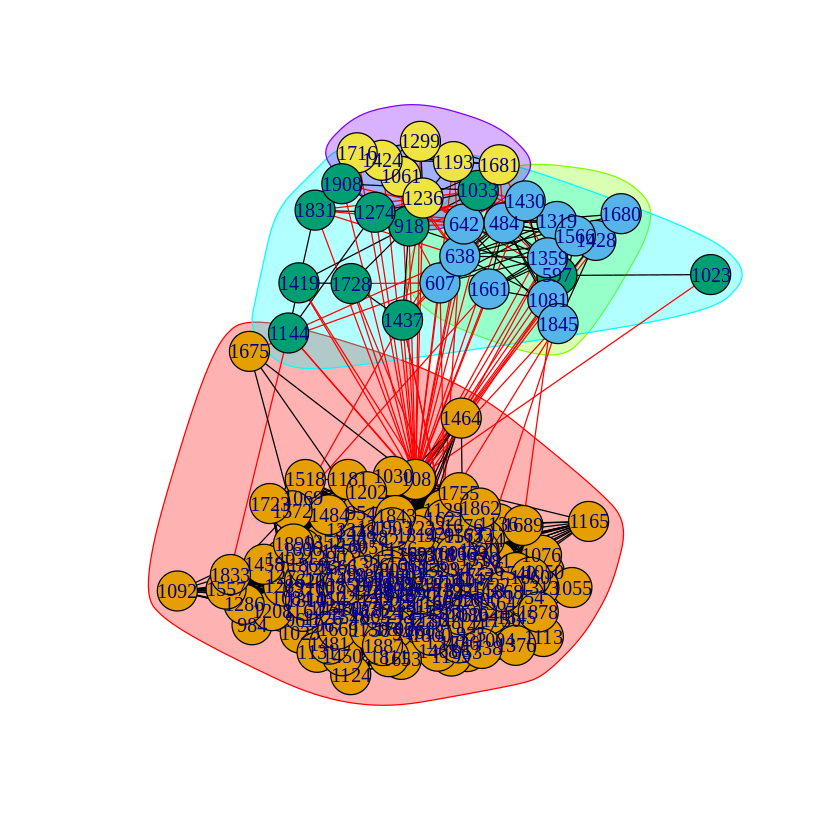

In [86]:
removed_imc_facebook_1087 <- infomap.community(removed_ego_facebook_personal_idx_1087)
plot(removed_imc_facebook_1087, removed_ego_facebook_personal_idx_1087)

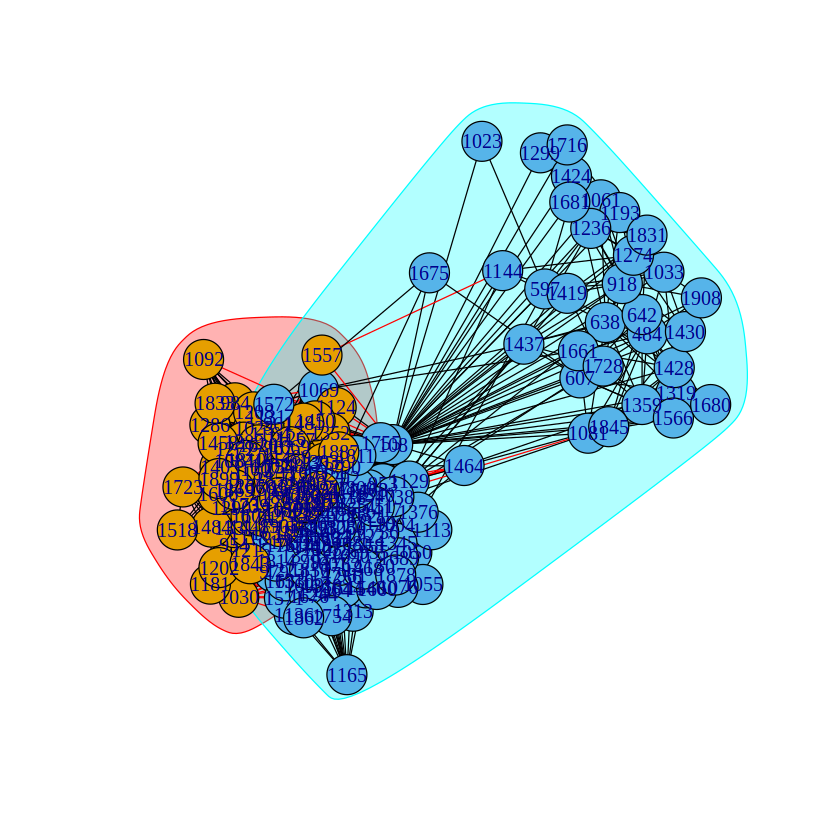

In [87]:
removed_fgc_facebook_1087 <- fastgreedy.community(removed_ego_facebook_personal_idx_1087)
plot(removed_fgc_facebook_1087, removed_ego_facebook_personal_idx_1087)

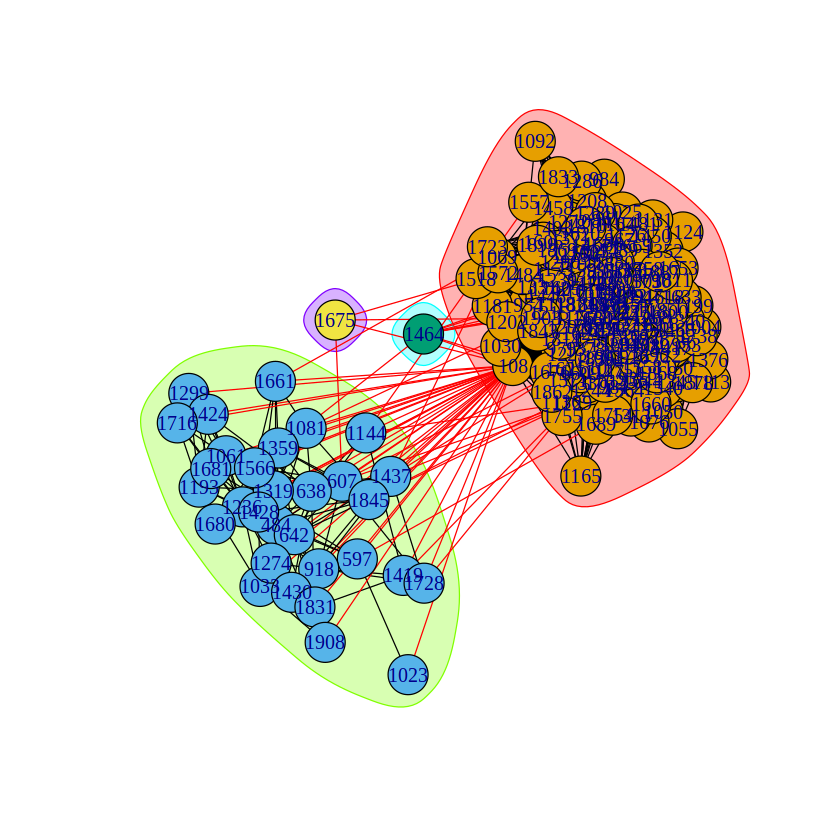

In [88]:
removed_ebc_facebook_1087 <- edge.betweenness.community(removed_ego_facebook_personal_idx_1087)
plot(removed_ebc_facebook_1087, removed_ego_facebook_personal_idx_1087)

In [89]:
##### Modularities
removed_modularity_imc_1087 <- modularity(removed_imc_facebook_1087)
removed_modularity_fgc_1087 <- modularity(removed_fgc_facebook_1087)
removed_modularity_ebc_1087 <- modularity(removed_ebc_facebook_1087)
cat('Cluster modularity of Removed Node ID 1087 using Infomap: ', removed_modularity_imc_1087, '\n')
cat('Cluster modularity of Removed Node ID 1087 using fast greedy method: ', removed_modularity_fgc_1087, '\n')
cat('Cluster modularity of Removed Node ID 1087 using edge betweenness: ', removed_modularity_ebc_1087, '\n')

Cluster modularity of Removed Node ID 1087 using Infomap:  0.02777604 
Cluster modularity of Removed Node ID 1087 using fast greedy method:  0.1481956 
Cluster modularity of Removed Node ID 1087 using edge betweenness:  0.0324953 


### Q11

In [267]:
# N/A

### Q12

#### Q12: Node ID 1

In [268]:
all_vertices_idx_1 <- V(ego_facebook_personal_idx_1)

embeddedness_pairs_idx_1 <- list()
dispersion_pairs_idx_1 <- list()
core_node_idx_1 <- c('1')
temp_neighbors_core_idx_1 <- neighbors(ego_facebook_personal_idx_1, core_node_idx_1) # Find neighbors of core node

for (i in 1:length(all_vertices_idx_1)){ 
    temp_neighbors_query <- neighbors(ego_facebook_personal_idx_1,all_vertices_idx_1[[i]]) # Find neighbors of queried node
    intersection_core_query <- intersection(temp_neighbors_core_idx_1, temp_neighbors_query)

    ##### Compute embeddedness
    temp_embeddedness <- length(intersection_core_query) 
    embeddedness_pairs_idx_1 <- append(embeddedness_pairs_idx_1, temp_embeddedness, after=i)

    ##### Remove core and query vertices
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_1, core_node_idx_1)
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_1, c(i))
    temp_distances <- distances(ego_facebook_remove_core_and_query)

    ##### Compute dispersion by summing the distances of every pair of mutual friends
    temp_dispersion <- sum(temp_distances[temp_distances != Inf])/2
    dispersion_pairs_idx_1 <- append(dispersion_pairs_idx_1, temp_dispersion, after=i)
}

embeddedness_pairs_idx_1 <- unlist(embeddedness_pairs_idx_1)
dispersion_pairs_idx_1 <- unlist(dispersion_pairs_idx_1)

In [269]:
##### ========== Do I need to remove the core node for embeddedness? =========== #####

#numeric_ind_idx_1 <- which(all_vertices_idx_1 == c('1'))
#no_core_node_graph_idx_1 <- setdiff(1:length(all_vertices_idx_1),c(numeric_ind_idx_1))

#embeddedness_pairs_idx_1 <- embeddedness_pairs_idx_1[no_core_node_graph_idx_1]
#dispersion_pairs_idx_1 <- dispersion_pairs_idx_1[no_core_node_graph_idx_1]

##### ========================================================================== #####

In [270]:
length(dispersion_pairs_idx_1)

[1] 348

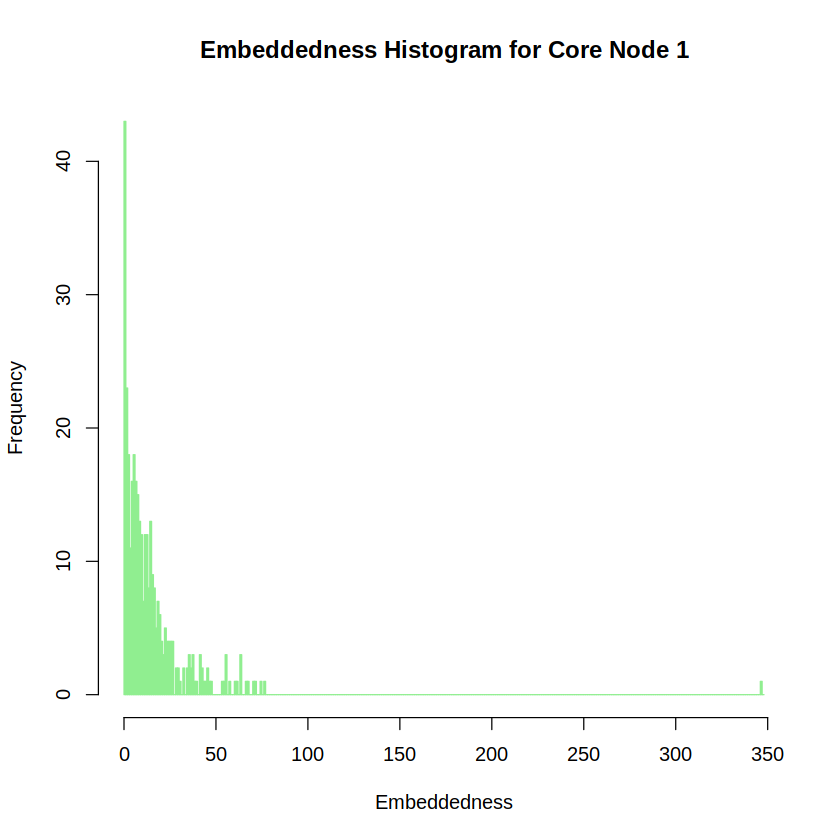

In [271]:
hist(embeddedness_pairs_idx_1, col="lightgreen", border="lightgreen", breaks=seq(0.0, by=1, length.out=max(embeddedness_pairs_idx_1)+2), xlab='Embeddedness', ylab='Frequency',main='Embeddedness Histogram for Core Node 1')

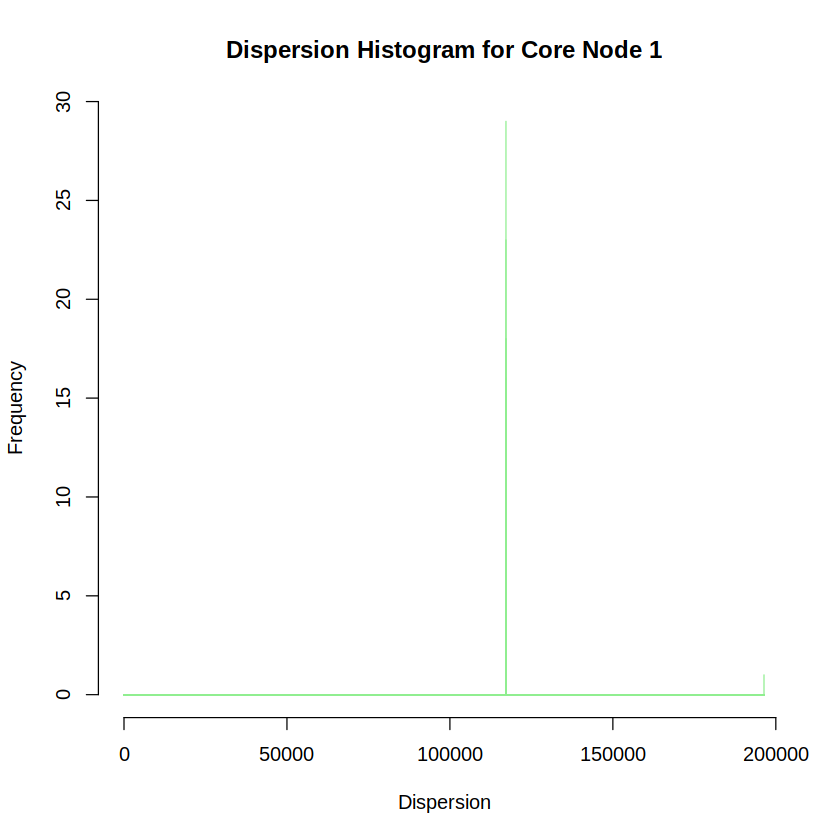

In [272]:
hist(dispersion_pairs_idx_1, col="lightgreen", border="lightgreen", breaks=seq(0, by=1, length.out=max((dispersion_pairs_idx_1)+2)), xlab='Dispersion', ylab='Frequency',main='Dispersion Histogram for Core Node 1')

#### Q12: Node ID 108

In [273]:
all_vertices_idx_108 <- V(ego_facebook_personal_idx_108)

embeddedness_pairs_idx_108 <- list()
dispersion_pairs_idx_108 <- list()
core_node_idx_108 <- c('108')
temp_neighbors_core_idx_108 <- neighbors(ego_facebook_personal_idx_108, core_node_idx_108) # Find neighbors of core node

for (i in 1:length(all_vertices_idx_108)){ 
    temp_neighbors_query <- neighbors(ego_facebook_personal_idx_108,all_vertices_idx_108[[i]]) # Find neighbors of queried node
    intersection_core_query <- intersection(temp_neighbors_core_idx_108, temp_neighbors_query)

    ##### Compute embeddedness
    temp_embeddedness <- length(intersection_core_query) 
    embeddedness_pairs_idx_108 <- append(embeddedness_pairs_idx_108, temp_embeddedness, after=i)

    ##### Remove core and query vertices
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_108, core_node_idx_108)
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_108, c(i))
    temp_distances <- distances(ego_facebook_remove_core_and_query)

    ##### Compute dispersion by summing the distances of every pair of mutual friends
    temp_dispersion <- sum(temp_distances[temp_distances != Inf])/2
    dispersion_pairs_idx_108 <- append(dispersion_pairs_idx_108, temp_dispersion, after=i)
}

embeddedness_pairs_idx_108 <- unlist(embeddedness_pairs_idx_108)
dispersion_pairs_idx_108 <- unlist(dispersion_pairs_idx_108)

#hist(all_neighbors_all_vertices_idx_108)

In [274]:
length(dispersion_pairs_idx_108)

[1] 1046

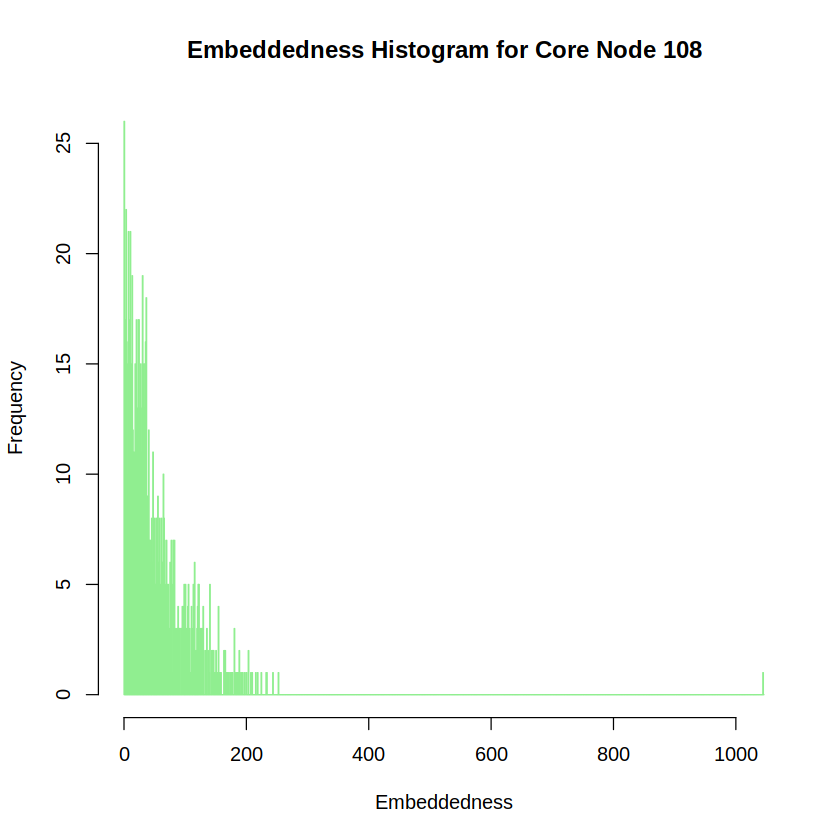

In [275]:
hist(embeddedness_pairs_idx_108, col="lightgreen", border="lightgreen", breaks=seq(0.0, by=1, length.out=max(embeddedness_pairs_idx_108)+2), xlab='Embeddedness', ylab='Frequency',main='Embeddedness Histogram for Core Node 108')

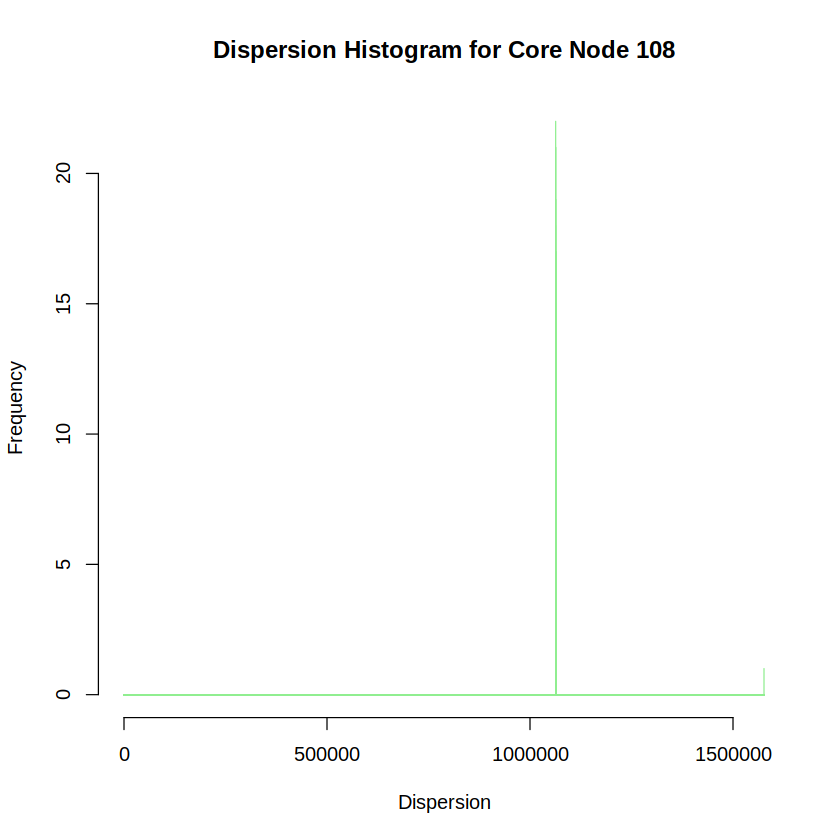

In [276]:
hist(dispersion_pairs_idx_108, col="lightgreen", border="lightgreen", breaks=seq(0, by=1, length.out=max((dispersion_pairs_idx_108)+2)), xlab='Dispersion', ylab='Frequency',main='Dispersion Histogram for Core Node 108')

#### Q12: Node ID 349

In [277]:
all_vertices_idx_349 <- V(ego_facebook_personal_idx_349)

embeddedness_pairs_idx_349 <- list()
dispersion_pairs_idx_349 <- list()
core_node_idx_349 <- c('349')
temp_neighbors_core_idx_349 <- neighbors(ego_facebook_personal_idx_349, core_node_idx_349) # Find neighbors of core node

for (i in 1:length(all_vertices_idx_349)){ 
    temp_neighbors_query <- neighbors(ego_facebook_personal_idx_349,all_vertices_idx_349[[i]]) # Find neighbors of queried node
    intersection_core_query <- intersection(temp_neighbors_core_idx_349, temp_neighbors_query)

    ##### Compute embeddedness
    temp_embeddedness <- length(intersection_core_query) 
    embeddedness_pairs_idx_349 <- append(embeddedness_pairs_idx_349, temp_embeddedness, after=i)

    ##### Remove core and query vertices
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_349, core_node_idx_349)
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_349, c(i))
    temp_distances <- distances(ego_facebook_remove_core_and_query)

    ##### Compute dispersion by summing the distances of every pair of mutual friends
    temp_dispersion <- sum(temp_distances[temp_distances != Inf])/2
    dispersion_pairs_idx_349 <- append(dispersion_pairs_idx_349, temp_dispersion, after=i)
}

embeddedness_pairs_idx_349 <- unlist(embeddedness_pairs_idx_349)
dispersion_pairs_idx_349 <- unlist(dispersion_pairs_idx_349)

#hist(all_neighbors_all_vertices_idx_349)

In [278]:
length(dispersion_pairs_idx_349)

[1] 230

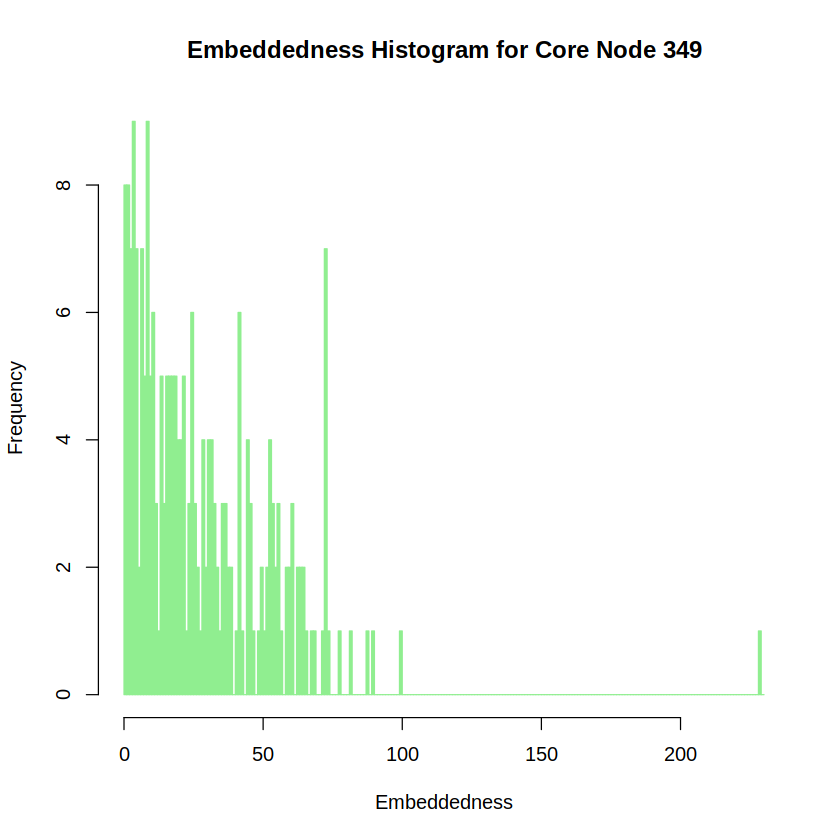

In [279]:
hist(embeddedness_pairs_idx_349, col="lightgreen", border="lightgreen", breaks=seq(0.0, by=1, length.out=max(embeddedness_pairs_idx_349)+2), xlab='Embeddedness', ylab='Frequency',main='Embeddedness Histogram for Core Node 349')

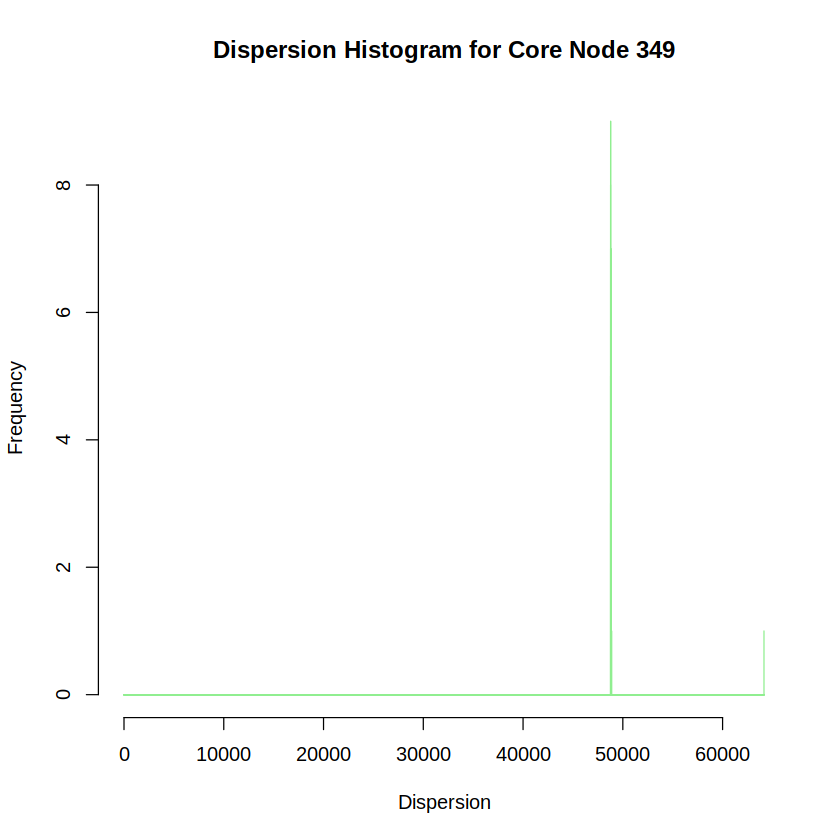

In [280]:
hist(dispersion_pairs_idx_349, col="lightgreen", border="lightgreen", breaks=seq(0.0, by=1, length.out=max((dispersion_pairs_idx_349)+2)), xlab='Dispersion', ylab='Frequency',main='Dispersion Histogram for Core Node 349')

#### Q12: Node ID 484

In [281]:
all_vertices_idx_484 <- V(ego_facebook_personal_idx_484)

embeddedness_pairs_idx_484 <- list()
dispersion_pairs_idx_484 <- list()
core_node_idx_484 <- c('484')
temp_neighbors_core_idx_484 <- neighbors(ego_facebook_personal_idx_484, core_node_idx_484) # Find neighbors of core node

for (i in 1:length(all_vertices_idx_484)){ 
    temp_neighbors_query <- neighbors(ego_facebook_personal_idx_484,all_vertices_idx_484[[i]]) # Find neighbors of queried node
    intersection_core_query <- intersection(temp_neighbors_core_idx_484, temp_neighbors_query)

    ##### Compute embeddedness
    temp_embeddedness <- length(intersection_core_query) 
    embeddedness_pairs_idx_484 <- append(embeddedness_pairs_idx_484, temp_embeddedness, after=i)

    ##### Remove core and query vertices
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_484, core_node_idx_484)
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_484, c(i))
    temp_distances <- distances(ego_facebook_remove_core_and_query)

    ##### Compute dispersion by summing the distances of every pair of mutual friends
    temp_dispersion <- sum(temp_distances[temp_distances != Inf])/2
    dispersion_pairs_idx_484 <- append(dispersion_pairs_idx_484, temp_dispersion, after=i)
}

embeddedness_pairs_idx_484 <- unlist(embeddedness_pairs_idx_484)
dispersion_pairs_idx_484 <- unlist(dispersion_pairs_idx_484)

#hist(all_neighbors_all_vertices_idx_484)

In [282]:
length(dispersion_pairs_idx_484)

[1] 232

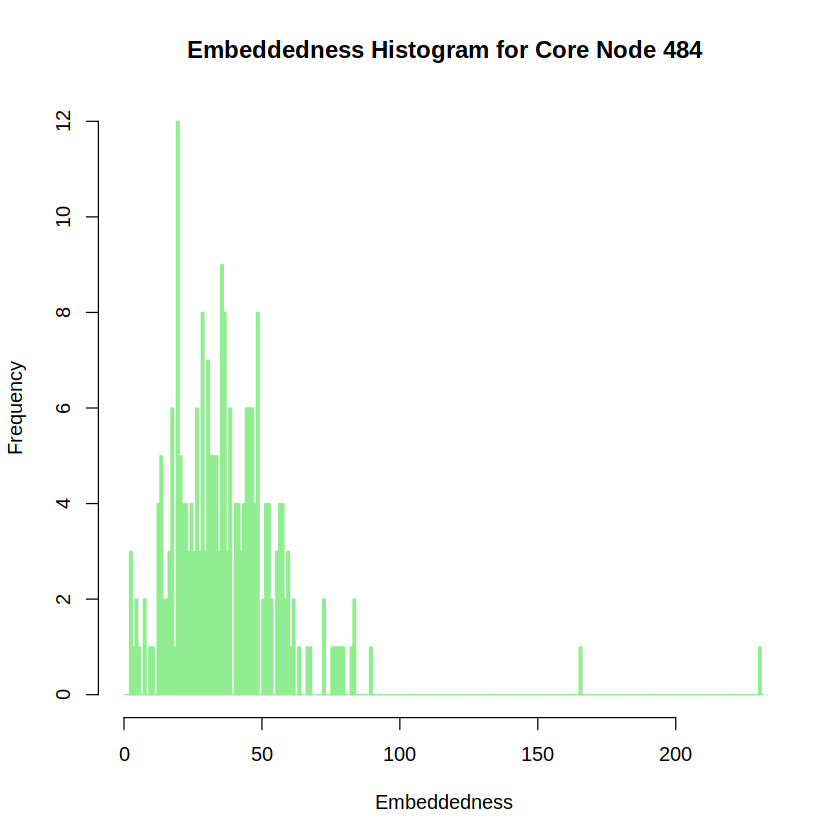

In [283]:
hist(embeddedness_pairs_idx_484, col="lightgreen", border="lightgreen", breaks=seq(0.0, by=1, length.out=max(embeddedness_pairs_idx_484)+2), xlab='Embeddedness', ylab='Frequency',main='Embeddedness Histogram for Core Node 484')

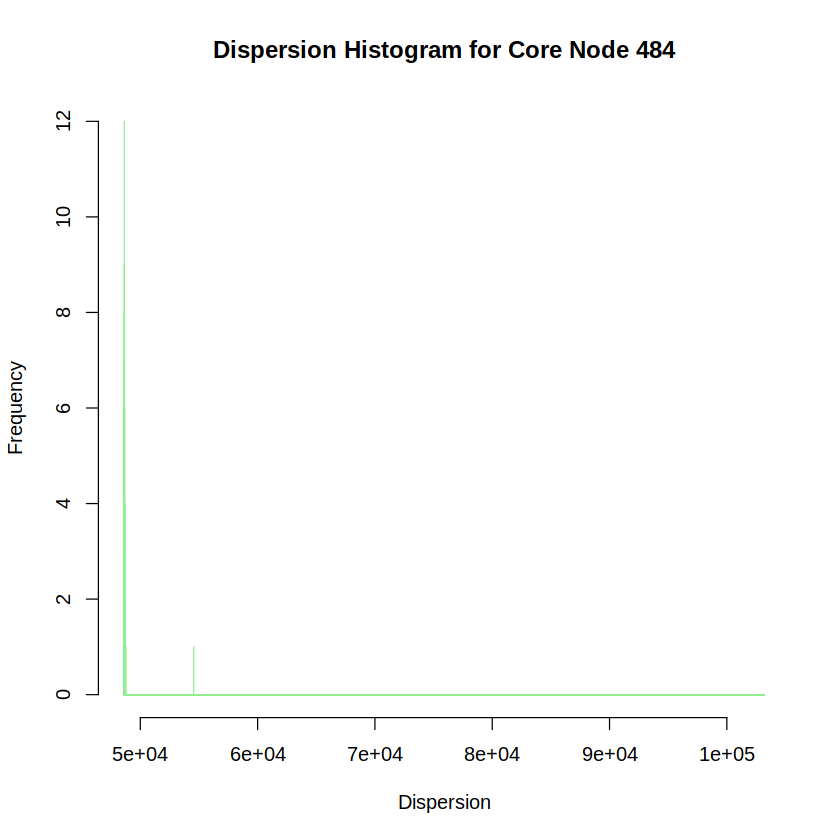

In [284]:
hist(dispersion_pairs_idx_484, col="lightgreen", border="lightgreen", breaks=seq(min(dispersion_pairs_idx_484), by=1, length.out=max((dispersion_pairs_idx_484)+2)), xlab='Dispersion', ylab='Frequency',main='Dispersion Histogram for Core Node 484')

#### Q12: Node ID 1087

In [285]:
all_vertices_idx_1087 <- V(ego_facebook_personal_idx_1087)

embeddedness_pairs_idx_1087 <- list()
dispersion_pairs_idx_1087 <- list()
core_node_idx_1087 <- c('1087')
temp_neighbors_core_idx_1087 <- neighbors(ego_facebook_personal_idx_1087, core_node_idx_1087) # Find neighbors of core node

for (i in 1:length(all_vertices_idx_1087)){ 
    temp_neighbors_query <- neighbors(ego_facebook_personal_idx_1087,all_vertices_idx_1087[[i]]) # Find neighbors of queried node
    intersection_core_query <- intersection(temp_neighbors_core_idx_1087, temp_neighbors_query)

    ##### Compute embeddedness
    temp_embeddedness <- length(intersection_core_query) 
    embeddedness_pairs_idx_1087 <- append(embeddedness_pairs_idx_1087, temp_embeddedness, after=i)

    ##### Remove core and query vertices
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_1087, core_node_idx_1087)
    ego_facebook_remove_core_and_query <- delete_vertices(ego_facebook_personal_idx_1087, c(i))
    temp_distances <- distances(ego_facebook_remove_core_and_query)

    ##### Compute dispersion by summing the distances of every pair of mutual friends
    temp_dispersion <- sum(temp_distances[temp_distances != Inf])/2
    dispersion_pairs_idx_1087 <- append(dispersion_pairs_idx_1087, temp_dispersion, after=i)
}

embeddedness_pairs_idx_1087 <- unlist(embeddedness_pairs_idx_1087)
dispersion_pairs_idx_1087 <- unlist(dispersion_pairs_idx_1087)

#hist(all_neighbors_all_vertices_idx_1087)

In [286]:
length(dispersion_pairs_idx_1087)

[1] 206

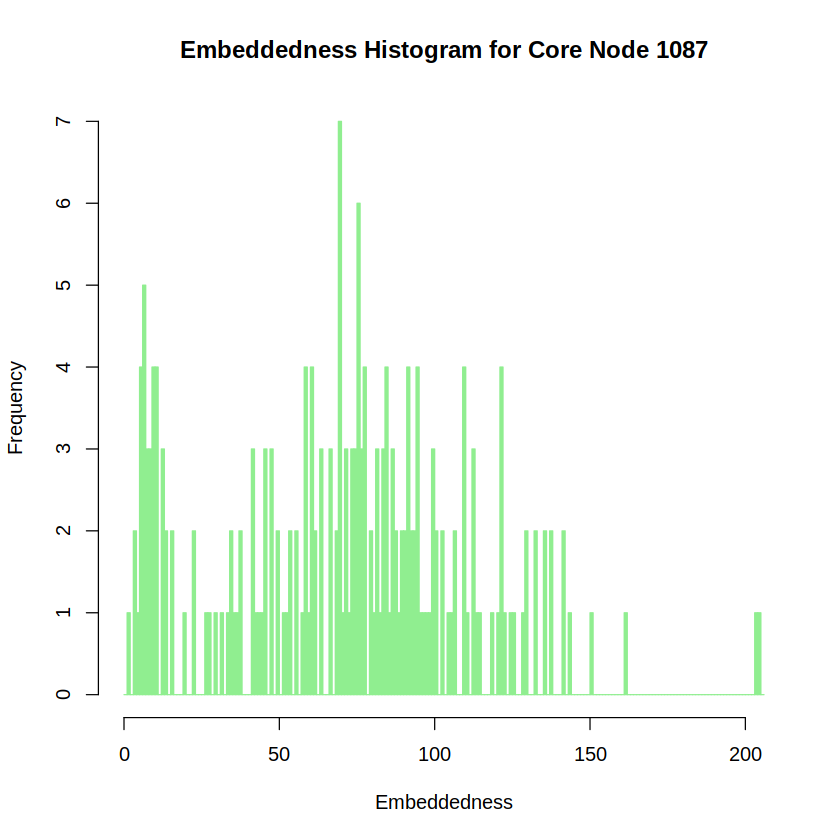

In [287]:
hist(embeddedness_pairs_idx_1087, col="lightgreen", border="lightgreen", breaks=seq(0.0, by=1, length.out=max(embeddedness_pairs_idx_1087)+2), xlab='Embeddedness', ylab='Frequency',main='Embeddedness Histogram for Core Node 1087')

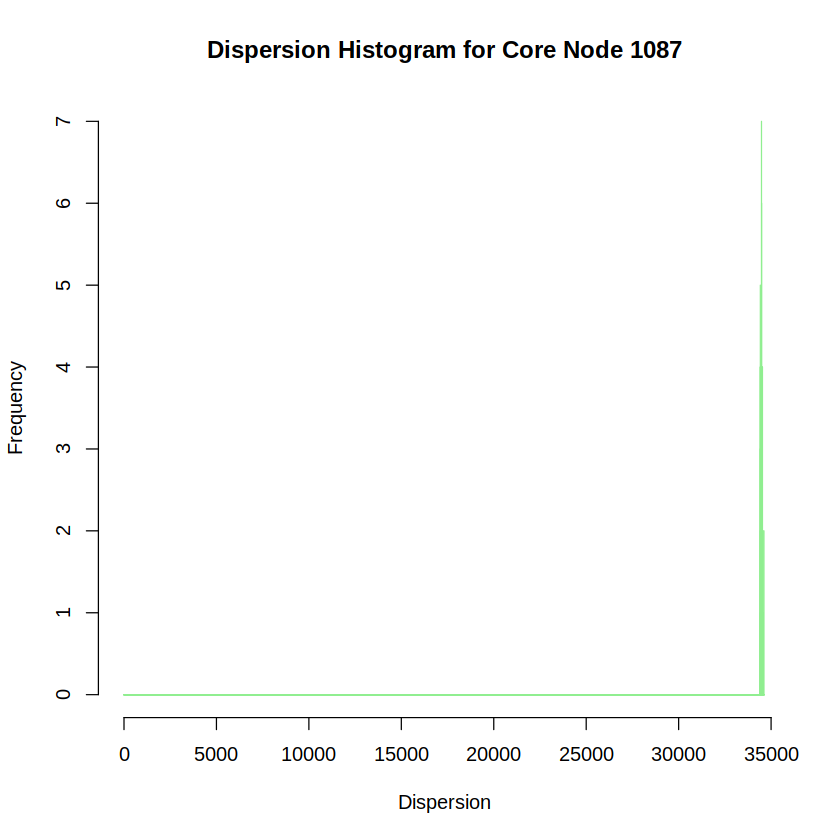

In [288]:
hist(dispersion_pairs_idx_1087, col="lightgreen", border="lightgreen", breaks=seq(0, by=1, length.out=max((dispersion_pairs_idx_1087)+2)), xlab='Dispersion', ylab='Frequency',main='Dispersion Histogram for Core Node 1087')

### Q13

In [289]:
set.seed(42)

#### Q13: Node ID 1

+ 1/348 vertex, named, from 6172a3b:
[1] 1
Edges:  2866+ 1/348 vertex, named, from 6172a3b:
[1] 1


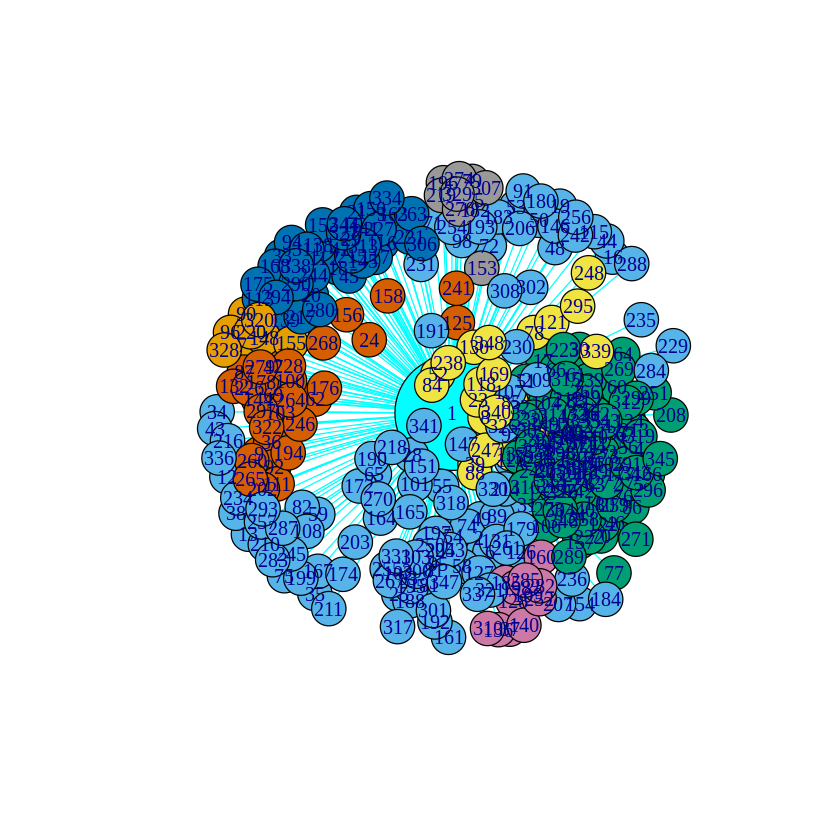

In [290]:
colorful_ego_facebook_personal_idx_1 <- ego_facebook_personal_idx_1 ##### Copy facebook
colorful_ego_facebook_personal_idx_1.com <- fgc_facebook_1 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_1)$color <- colorful_ego_facebook_personal_idx_1.com$membership + 1
max_dispersion_ind_fgc_1 <- which.max(dispersion_pairs_idx_1)

V(colorful_ego_facebook_personal_idx_1)[max_dispersion_ind_fgc_1]$color <- 'cyan'
print(V(colorful_ego_facebook_personal_idx_1)[max_dispersion_ind_fgc_1]) ##### Print vertex with highest dispersion
max_dispersion_vertex_fgc_1 <- V(colorful_ego_facebook_personal_idx_1)[max_dispersion_ind_fgc_1] ##### Save vertex with max dispersion


vertex_sizes <- rep(15,length(dispersion_pairs_idx_1))
vertex_sizes[max_dispersion_ind_fgc_1] <- 50 ##### Enlarge node with highest dispersion
V(colorful_ego_facebook_personal_idx_1)$size <- vertex_sizes

##### Color edges
incident_edges_max_dispersion_vertex_fgc_1 <- incident(colorful_ego_facebook_personal_idx_1, max_dispersion_vertex_fgc_1)
edges_colorful_idx_1 <- E(colorful_ego_facebook_personal_idx_1)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_1)) {
    if (edges_colorful_idx_1[i] %in% incident_edges_max_dispersion_vertex_fgc_1) {
        E(colorful_ego_facebook_personal_idx_1)[i]$color <- 'cyan'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_1))
plot(colorful_ego_facebook_personal_idx_1)
print(max_dispersion_vertex_fgc_1)

#### Q13: Node ID 108

+ 1/1046 vertex, named, from ab2705c:
[1] 108
Edges:  27795+ 1/1046 vertex, named, from ab2705c:
[1] 108


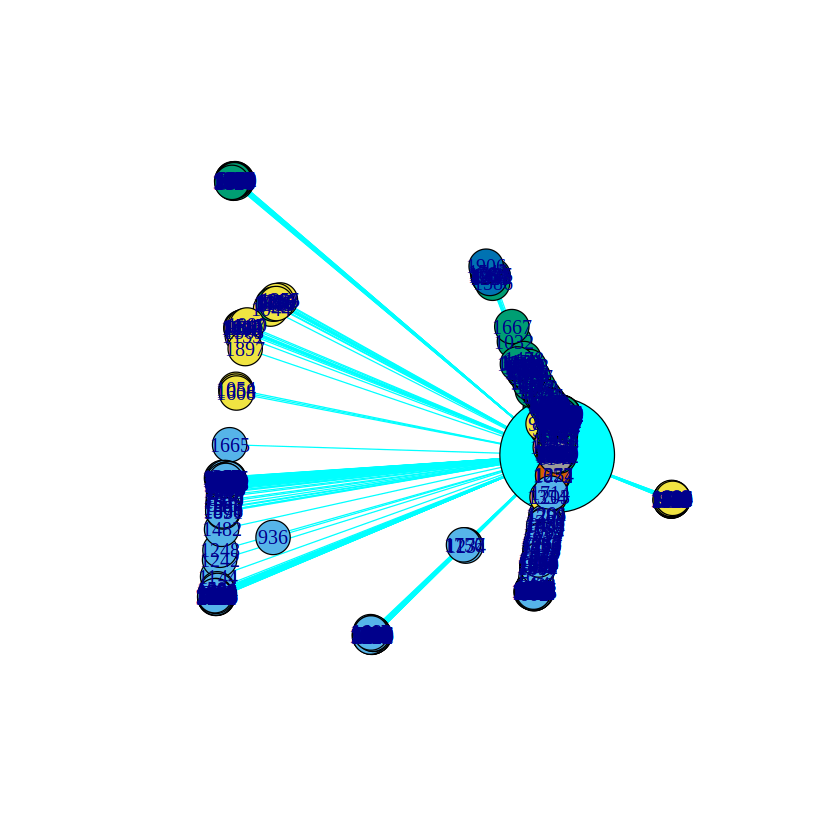

In [291]:
colorful_ego_facebook_personal_idx_108 <- ego_facebook_personal_idx_108 ##### Copy facebook
colorful_ego_facebook_personal_idx_108.com <- fgc_facebook_108 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_108)$color <- colorful_ego_facebook_personal_idx_108.com$membership + 1
max_dispersion_ind_fgc_108 <- which.max(dispersion_pairs_idx_108)

V(colorful_ego_facebook_personal_idx_108)[max_dispersion_ind_fgc_108]$color <- 'cyan'
print(V(colorful_ego_facebook_personal_idx_108)[max_dispersion_ind_fgc_108]) ##### Print vertex with highest dispersion
max_dispersion_vertex_fgc_108 <- V(colorful_ego_facebook_personal_idx_108)[max_dispersion_ind_fgc_108] ##### Save vertex with max dispersion


vertex_sizes <- rep(15,length(dispersion_pairs_idx_108))
vertex_sizes[max_dispersion_ind_fgc_108] <- 50 ##### Enlarge node with highest dispersion
V(colorful_ego_facebook_personal_idx_108)$size <- vertex_sizes

##### Color edges
incident_edges_max_dispersion_vertex_fgc_108 <- incident(colorful_ego_facebook_personal_idx_108, max_dispersion_vertex_fgc_108)
edges_colorful_idx_108 <- E(colorful_ego_facebook_personal_idx_108)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_108)) {
    if (edges_colorful_idx_108[i] %in% incident_edges_max_dispersion_vertex_fgc_108) {
        E(colorful_ego_facebook_personal_idx_108)[i]$color <- 'cyan'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_108))
plot(colorful_ego_facebook_personal_idx_108)
print(max_dispersion_vertex_fgc_108)

#### Q13: Node ID 349

+ 1/230 vertex, named, from a387cab:
[1] 349
Edges:  3441+ 1/230 vertex, named, from a387cab:
[1] 349


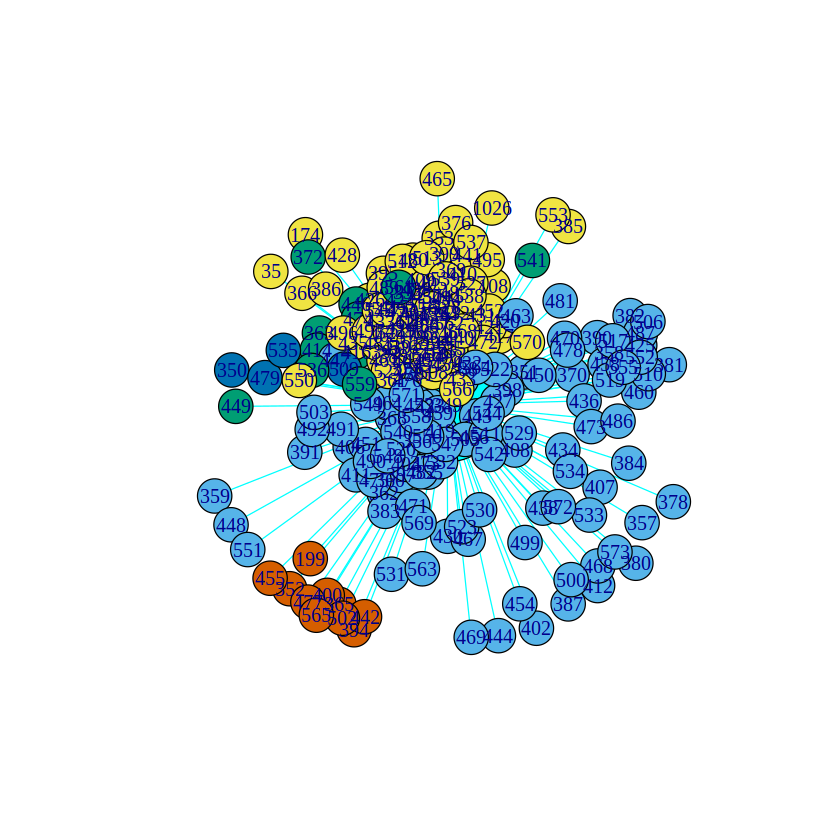

In [292]:
colorful_ego_facebook_personal_idx_349 <- ego_facebook_personal_idx_349 ##### Copy facebook
colorful_ego_facebook_personal_idx_349.com <- fgc_facebook_349 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_349)$color <- colorful_ego_facebook_personal_idx_349.com$membership + 1
max_dispersion_ind_fgc_349 <- which.max(dispersion_pairs_idx_349)

V(colorful_ego_facebook_personal_idx_349)[max_dispersion_ind_fgc_349]$color <- 'cyan'
print(V(colorful_ego_facebook_personal_idx_349)[max_dispersion_ind_fgc_349]) ##### Print vertex with highest dispersion
max_dispersion_vertex_fgc_349 <- V(colorful_ego_facebook_personal_idx_349)[max_dispersion_ind_fgc_349] ##### Save vertex with max dispersion


vertex_sizes <- rep(15,length(dispersion_pairs_idx_349))
vertex_sizes[max_dispersion_ind_fgc_349] <- 50 ##### Enlarge node with highest dispersion
V(colorful_ego_facebook_personal_idx_349)$size <- vertex_sizes

##### Color edges
incident_edges_max_dispersion_vertex_fgc_349 <- incident(colorful_ego_facebook_personal_idx_349, max_dispersion_vertex_fgc_349)
edges_colorful_idx_349 <- E(colorful_ego_facebook_personal_idx_349)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_349)) {
    if (edges_colorful_idx_349[i] %in% incident_edges_max_dispersion_vertex_fgc_349) {
        E(colorful_ego_facebook_personal_idx_349)[i]$color <- 'cyan'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_349))
plot(colorful_ego_facebook_personal_idx_349)
print(max_dispersion_vertex_fgc_349)

#### Q13: Node ID 484

+ 1/232 vertex, named, from 1e0adc7:
[1] 484
Edges:  4525+ 1/232 vertex, named, from 1e0adc7:
[1] 484


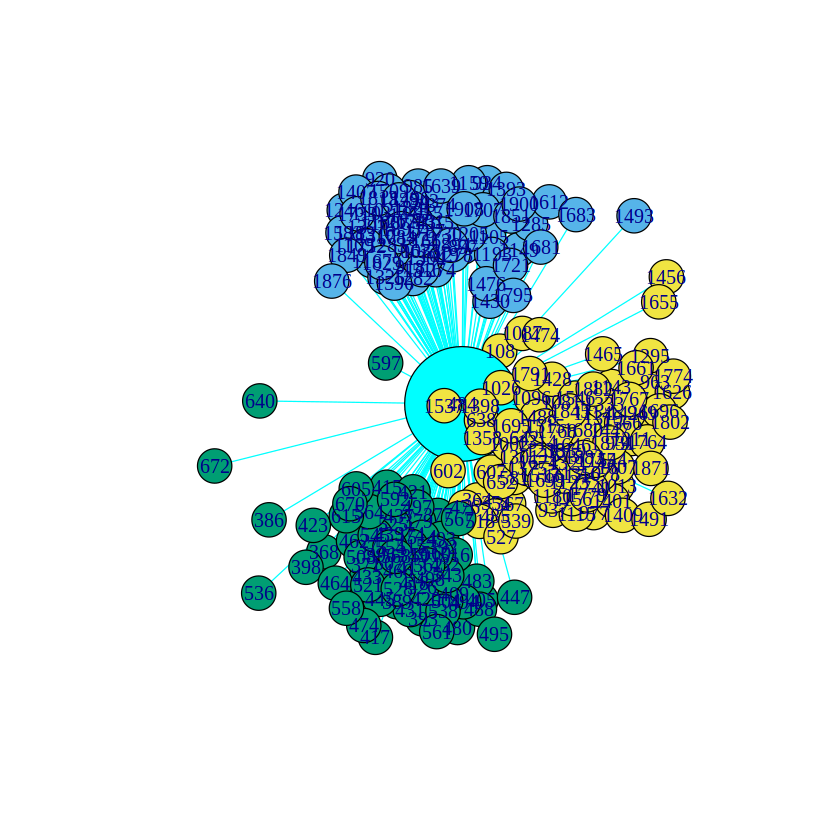

In [293]:
colorful_ego_facebook_personal_idx_484 <- ego_facebook_personal_idx_484 ##### Copy facebook
colorful_ego_facebook_personal_idx_484.com <- fgc_facebook_484 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_484)$color <- colorful_ego_facebook_personal_idx_484.com$membership + 1
max_dispersion_ind_fgc_484 <- which.max(dispersion_pairs_idx_484)

V(colorful_ego_facebook_personal_idx_484)[max_dispersion_ind_fgc_484]$color <- 'cyan'
print(V(colorful_ego_facebook_personal_idx_484)[max_dispersion_ind_fgc_484]) ##### Print vertex with highest dispersion
max_dispersion_vertex_fgc_484 <- V(colorful_ego_facebook_personal_idx_484)[max_dispersion_ind_fgc_484] ##### Save vertex with max dispersion


vertex_sizes <- rep(15,length(dispersion_pairs_idx_484))
vertex_sizes[max_dispersion_ind_fgc_484] <- 50 ##### Enlarge node with highest dispersion
V(colorful_ego_facebook_personal_idx_484)$size <- vertex_sizes

##### Color edges
incident_edges_max_dispersion_vertex_fgc_484 <- incident(colorful_ego_facebook_personal_idx_484, max_dispersion_vertex_fgc_484)
edges_colorful_idx_484 <- E(colorful_ego_facebook_personal_idx_484)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_484)) {
    if (edges_colorful_idx_484[i] %in% incident_edges_max_dispersion_vertex_fgc_484) {
        E(colorful_ego_facebook_personal_idx_484)[i]$color <- 'cyan'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_484))
plot(colorful_ego_facebook_personal_idx_484)
print(max_dispersion_vertex_fgc_484)

#### Q13: Node ID 1087

+ 1/206 vertex, named, from 5e00ca3:
[1] 108
Edges:  7409+ 1/206 vertex, named, from 5e00ca3:
[1] 108


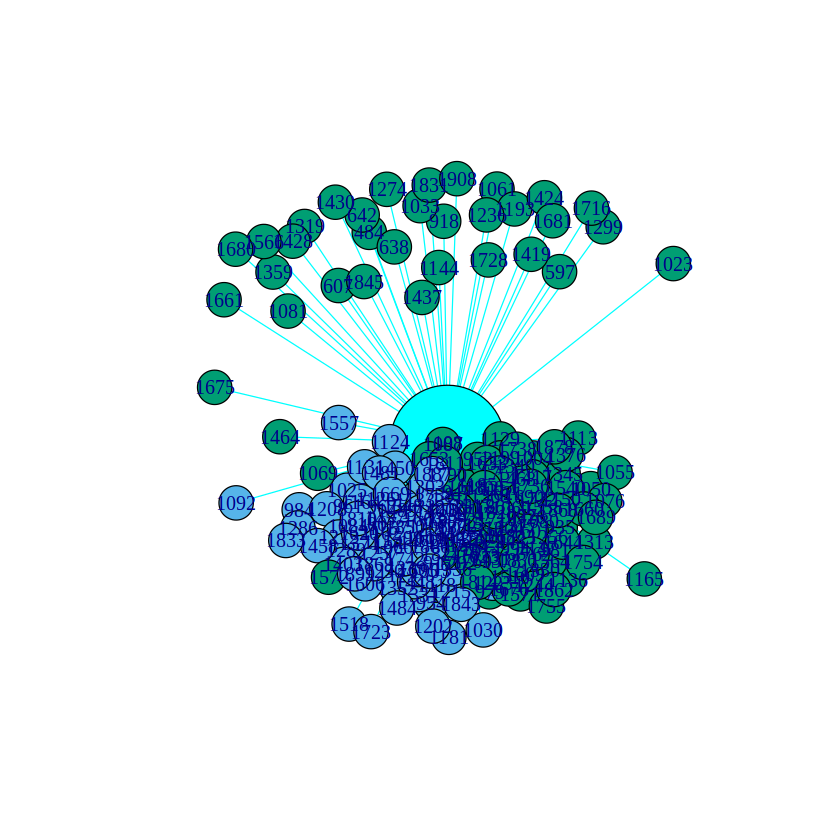

In [294]:
colorful_ego_facebook_personal_idx_1087 <- ego_facebook_personal_idx_1087 ##### Copy facebook
colorful_ego_facebook_personal_idx_1087.com <- fgc_facebook_1087 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_1087)$color <- colorful_ego_facebook_personal_idx_1087.com$membership + 1
max_dispersion_ind_fgc_1087 <- which.max(dispersion_pairs_idx_1087)

V(colorful_ego_facebook_personal_idx_1087)[max_dispersion_ind_fgc_1087]$color <- 'cyan'
print(V(colorful_ego_facebook_personal_idx_1087)[max_dispersion_ind_fgc_1087]) ##### Print vertex with highest dispersion
max_dispersion_vertex_fgc_1087 <- V(colorful_ego_facebook_personal_idx_1087)[max_dispersion_ind_fgc_1087] ##### Save vertex with max dispersion


vertex_sizes <- rep(15,length(dispersion_pairs_idx_1087))
vertex_sizes[max_dispersion_ind_fgc_1087] <- 50 ##### Enlarge node with highest dispersion
V(colorful_ego_facebook_personal_idx_1087)$size <- vertex_sizes

##### Color edges
incident_edges_max_dispersion_vertex_fgc_1087 <- incident(colorful_ego_facebook_personal_idx_1087, max_dispersion_vertex_fgc_1087)
edges_colorful_idx_1087 <- E(colorful_ego_facebook_personal_idx_1087)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_1087)) {
    if (edges_colorful_idx_1087[i] %in% incident_edges_max_dispersion_vertex_fgc_1087) {
        E(colorful_ego_facebook_personal_idx_1087)[i]$color <- 'cyan'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_1087))
plot(colorful_ego_facebook_personal_idx_1087)
print(max_dispersion_vertex_fgc_1087)

### Q14

In [295]:
set.seed(42)

#### Q14: Node ID 1

In [296]:
dispersion_to_embeddedness_ratio_idx_1 <- dispersion_pairs_idx_1 / embeddedness_pairs_idx_1

[1] "Highest embeddedness vertex ID:"
+ 1/348 vertex, named, from 6172a3b:
[1] 1
[1] "Highest ratio vertex ID:"
+ 1/348 vertex, named, from 6172a3b:
[1] 12
Edges:  2866

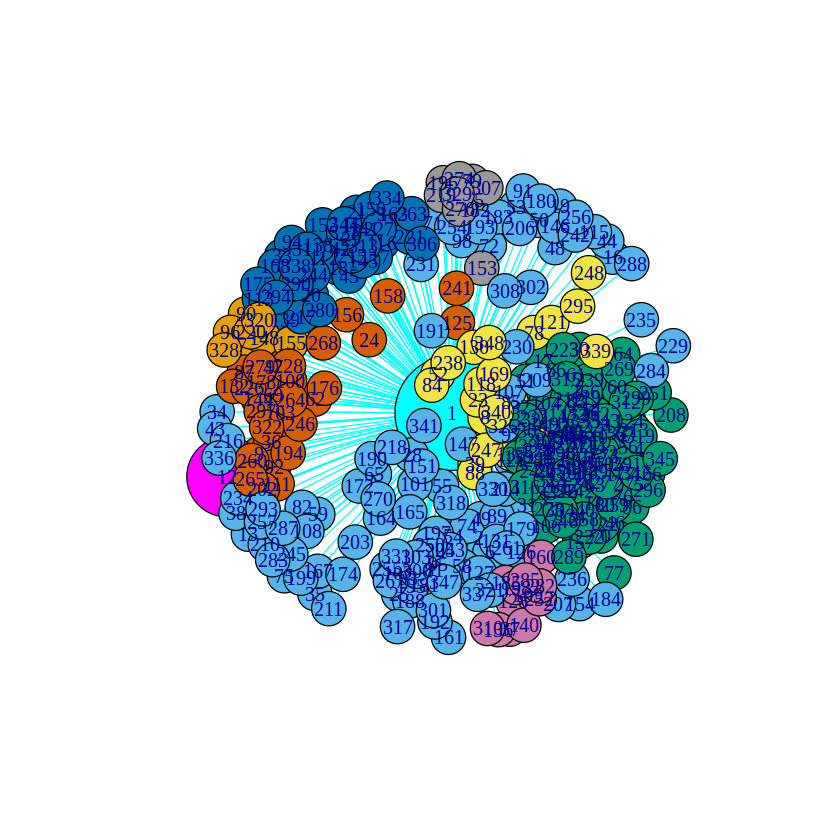

In [297]:
colorful_ego_facebook_personal_idx_1 <- ego_facebook_personal_idx_1 ##### Copy facebook
colorful_ego_facebook_personal_idx_1.com <- fgc_facebook_1 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_1)$color <- colorful_ego_facebook_personal_idx_1.com$membership + 1
max_embeddedness_ind_fgc_1 <- which.max(embeddedness_pairs_idx_1)
max_disp2emb_ind_fgc_1 <- which.max(dispersion_to_embeddedness_ratio_idx_1)

# ====================
V(colorful_ego_facebook_personal_idx_1)[max_embeddedness_ind_fgc_1]$color <- 'cyan'
print('Highest embeddedness vertex ID:')
print(V(colorful_ego_facebook_personal_idx_1)[max_embeddedness_ind_fgc_1]) ##### Print vertex with highest embeddedness
max_embeddedness_vertex_fgc_1 <- V(colorful_ego_facebook_personal_idx_1)[max_embeddedness_ind_fgc_1] ##### Save vertex with max embeddedness

V(colorful_ego_facebook_personal_idx_1)[max_disp2emb_ind_fgc_1]$color <- 'magenta'
print('Highest ratio vertex ID:')
print(V(colorful_ego_facebook_personal_idx_1)[max_disp2emb_ind_fgc_1])
max_disp2emb_vertex_fgc_1 <- V(colorful_ego_facebook_personal_idx_1)[max_disp2emb_ind_fgc_1] ##### Save vertex with max dispersion to embeddedness ratio

vertex_sizes <- rep(15,length(embeddedness_pairs_idx_1))
vertex_sizes[max_embeddedness_ind_fgc_1] <- 50 ##### Enlarge node with highest embeddedness
vertex_sizes[max_disp2emb_ind_fgc_1] <- 35 ##### Enlarge node with highest disp2emb ratio
V(colorful_ego_facebook_personal_idx_1)$size <- vertex_sizes

##### Color edges
incident_edges_max_embeddedness_vertex_fgc_1 <- incident(colorful_ego_facebook_personal_idx_1, max_embeddedness_vertex_fgc_1) ### embeddedness
incident_edges_max_emb2disp_vertex_fgc_1 <- incident(colorful_ego_facebook_personal_idx_1, max_disp2emb_vertex_fgc_1)

edges_colorful_idx_1 <- E(colorful_ego_facebook_personal_idx_1)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_1)) {
    if (edges_colorful_idx_1[i] %in% incident_edges_max_embeddedness_vertex_fgc_1) { ##### If edges are connected to node with max embeddednes
        E(colorful_ego_facebook_personal_idx_1)[i]$color <- 'cyan'
    } else if (edges_colorful_idx_1[i] %in% incident_edges_max_emb2disp_vertex_fgc_1) { ##### If edges are connected to node with max disp2emb ratio
        E(colorful_ego_facebook_personal_idx_1)[i]$color <- 'magenta'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_1))
plot(colorful_ego_facebook_personal_idx_1)

#### Q14: Node ID 108

In [298]:
dispersion_to_embeddedness_ratio_idx_108 <- dispersion_pairs_idx_108 / embeddedness_pairs_idx_108

[1] "Highest embeddedness vertex ID:"
+ 1/1046 vertex, named, from ab2705c:
[1] 108
[1] "Highest ratio vertex ID:"
+ 1/1046 vertex, named, from ab2705c:
[1] 912
Edges:  27795

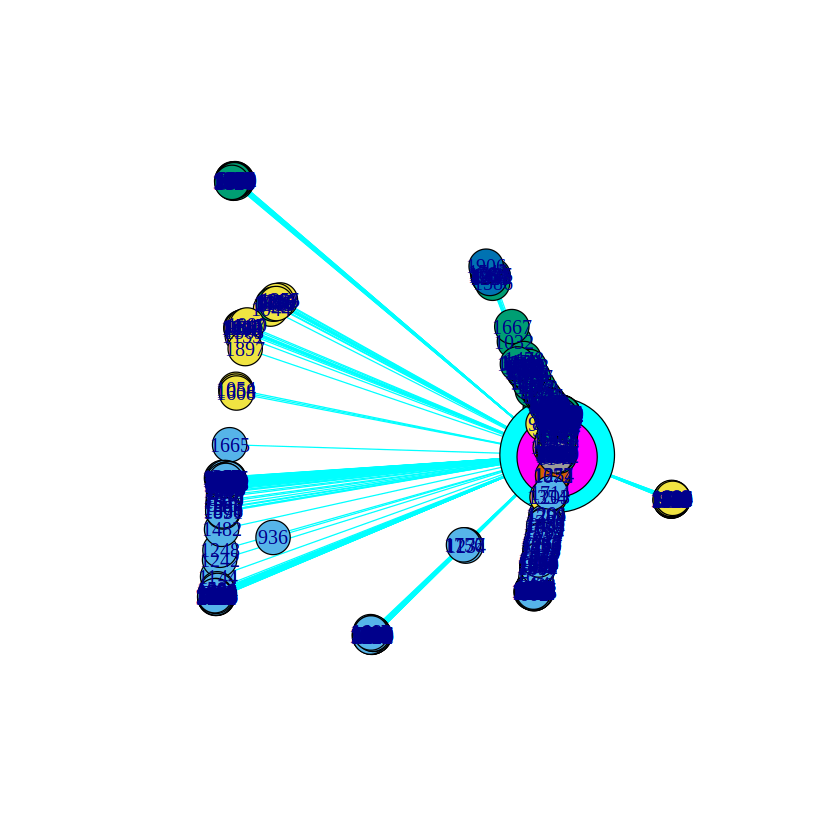

In [299]:
colorful_ego_facebook_personal_idx_108 <- ego_facebook_personal_idx_108 ##### Copy facebook
colorful_ego_facebook_personal_idx_108.com <- fgc_facebook_108 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_108)$color <- colorful_ego_facebook_personal_idx_108.com$membership + 1
max_embeddedness_ind_fgc_108 <- which.max(embeddedness_pairs_idx_108)
max_disp2emb_ind_fgc_108 <- which.max(dispersion_to_embeddedness_ratio_idx_108)

# ====================
V(colorful_ego_facebook_personal_idx_108)[max_embeddedness_ind_fgc_108]$color <- 'cyan'
print('Highest embeddedness vertex ID:')
print(V(colorful_ego_facebook_personal_idx_108)[max_embeddedness_ind_fgc_108]) ##### Print vertex with highest embeddedness
max_embeddedness_vertex_fgc_108 <- V(colorful_ego_facebook_personal_idx_108)[max_embeddedness_ind_fgc_108] ##### Save vertex with max embeddedness

V(colorful_ego_facebook_personal_idx_108)[max_disp2emb_ind_fgc_108]$color <- 'magenta'
print('Highest ratio vertex ID:')
print(V(colorful_ego_facebook_personal_idx_108)[max_disp2emb_ind_fgc_108])
max_disp2emb_vertex_fgc_108 <- V(colorful_ego_facebook_personal_idx_108)[max_disp2emb_ind_fgc_108] ##### Save vertex with max dispersion to embeddedness ratio

vertex_sizes <- rep(15,length(embeddedness_pairs_idx_108))
vertex_sizes[max_embeddedness_ind_fgc_108] <- 50 ##### Enlarge node with highest embeddedness
vertex_sizes[max_disp2emb_ind_fgc_108] <- 35 ##### Enlarge node with highest disp2emb ratio
V(colorful_ego_facebook_personal_idx_108)$size <- vertex_sizes

##### Color edges
incident_edges_max_embeddedness_vertex_fgc_108 <- incident(colorful_ego_facebook_personal_idx_108, max_embeddedness_vertex_fgc_108) ### embeddedness
incident_edges_max_emb2disp_vertex_fgc_108 <- incident(colorful_ego_facebook_personal_idx_108, max_disp2emb_vertex_fgc_108)

edges_colorful_idx_108 <- E(colorful_ego_facebook_personal_idx_108)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_108)) {
    if (edges_colorful_idx_108[i] %in% incident_edges_max_embeddedness_vertex_fgc_108) { ##### If edges are connected to node with max embeddednes
        E(colorful_ego_facebook_personal_idx_108)[i]$color <- 'cyan'
    } else if (edges_colorful_idx_108[i] %in% incident_edges_max_emb2disp_vertex_fgc_108) { ##### If edges are connected to node with max disp2emb ratio
        E(colorful_ego_facebook_personal_idx_108)[i]$color <- 'magenta'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_108))
plot(colorful_ego_facebook_personal_idx_108)

#### Q14: Node ID 349

In [300]:
dispersion_to_embeddedness_ratio_idx_349 <- dispersion_pairs_idx_349 / embeddedness_pairs_idx_349

[1] "Highest embeddedness vertex ID:"
+ 1/230 vertex, named, from a387cab:
[1] 349
[1] "Highest ratio vertex ID:"
+ 1/230 vertex, named, from a387cab:
[1] 359
Edges:  3441

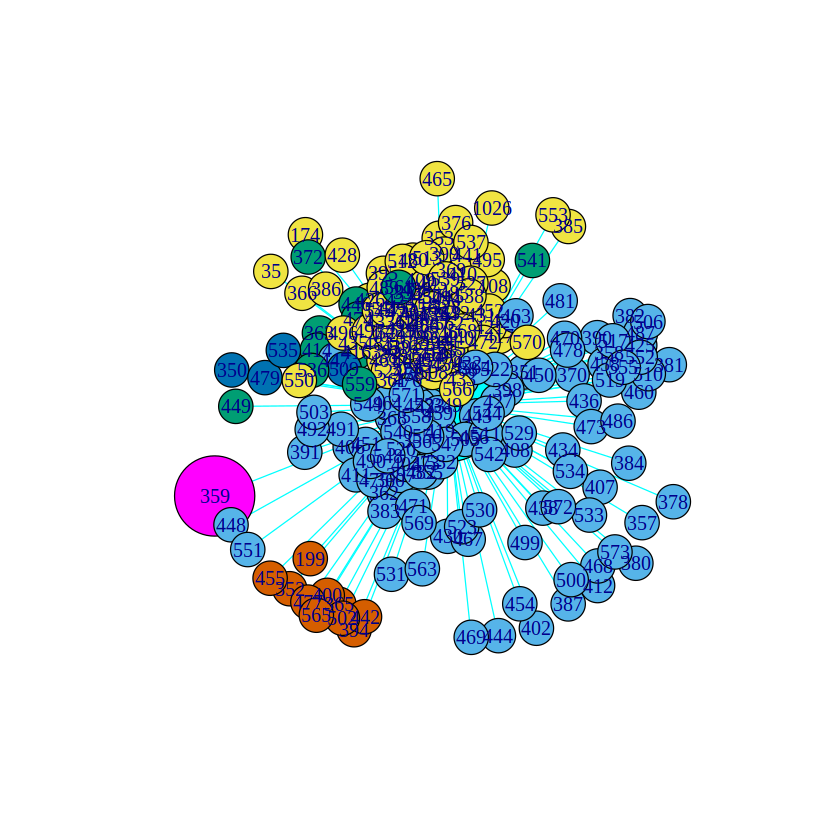

In [301]:
colorful_ego_facebook_personal_idx_349 <- ego_facebook_personal_idx_349 ##### Copy facebook
colorful_ego_facebook_personal_idx_349.com <- fgc_facebook_349 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_349)$color <- colorful_ego_facebook_personal_idx_349.com$membership + 1
max_embeddedness_ind_fgc_349 <- which.max(embeddedness_pairs_idx_349)
max_disp2emb_ind_fgc_349 <- which.max(dispersion_to_embeddedness_ratio_idx_349)

# ====================
V(colorful_ego_facebook_personal_idx_349)[max_embeddedness_ind_fgc_349]$color <- 'cyan'
print('Highest embeddedness vertex ID:')
print(V(colorful_ego_facebook_personal_idx_349)[max_embeddedness_ind_fgc_349]) ##### Print vertex with highest embeddedness
max_embeddedness_vertex_fgc_349 <- V(colorful_ego_facebook_personal_idx_349)[max_embeddedness_ind_fgc_349] ##### Save vertex with max embeddedness

V(colorful_ego_facebook_personal_idx_349)[max_disp2emb_ind_fgc_349]$color <- 'magenta'
print('Highest ratio vertex ID:')
print(V(colorful_ego_facebook_personal_idx_349)[max_disp2emb_ind_fgc_349])
max_disp2emb_vertex_fgc_349 <- V(colorful_ego_facebook_personal_idx_349)[max_disp2emb_ind_fgc_349] ##### Save vertex with max dispersion to embeddedness ratio

vertex_sizes <- rep(15,length(embeddedness_pairs_idx_349))
vertex_sizes[max_embeddedness_ind_fgc_349] <- 50 ##### Enlarge node with highest embeddedness
vertex_sizes[max_disp2emb_ind_fgc_349] <- 35 ##### Enlarge node with highest disp2emb ratio
V(colorful_ego_facebook_personal_idx_349)$size <- vertex_sizes

##### Color edges
incident_edges_max_embeddedness_vertex_fgc_349 <- incident(colorful_ego_facebook_personal_idx_349, max_embeddedness_vertex_fgc_349) ### embeddedness
incident_edges_max_emb2disp_vertex_fgc_349 <- incident(colorful_ego_facebook_personal_idx_349, max_disp2emb_vertex_fgc_349)

edges_colorful_idx_349 <- E(colorful_ego_facebook_personal_idx_349)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_349)) {
    if (edges_colorful_idx_349[i] %in% incident_edges_max_embeddedness_vertex_fgc_349) { ##### If edges are connected to node with max embeddednes
        E(colorful_ego_facebook_personal_idx_349)[i]$color <- 'cyan'
    } else if (edges_colorful_idx_349[i] %in% incident_edges_max_emb2disp_vertex_fgc_349) { ##### If edges are connected to node with max disp2emb ratio
        E(colorful_ego_facebook_personal_idx_349)[i]$color <- 'magenta'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_349))
plot(colorful_ego_facebook_personal_idx_349)

#### Q14: Node ID 484

In [302]:
dispersion_to_embeddedness_ratio_idx_484 <- dispersion_pairs_idx_484 / embeddedness_pairs_idx_484

[1] "Highest embeddedness vertex ID:"
+ 1/232 vertex, named, from 1e0adc7:
[1] 484
[1] "Highest ratio vertex ID:"
+ 1/232 vertex, named, from 1e0adc7:
[1] 640
Edges:  4525

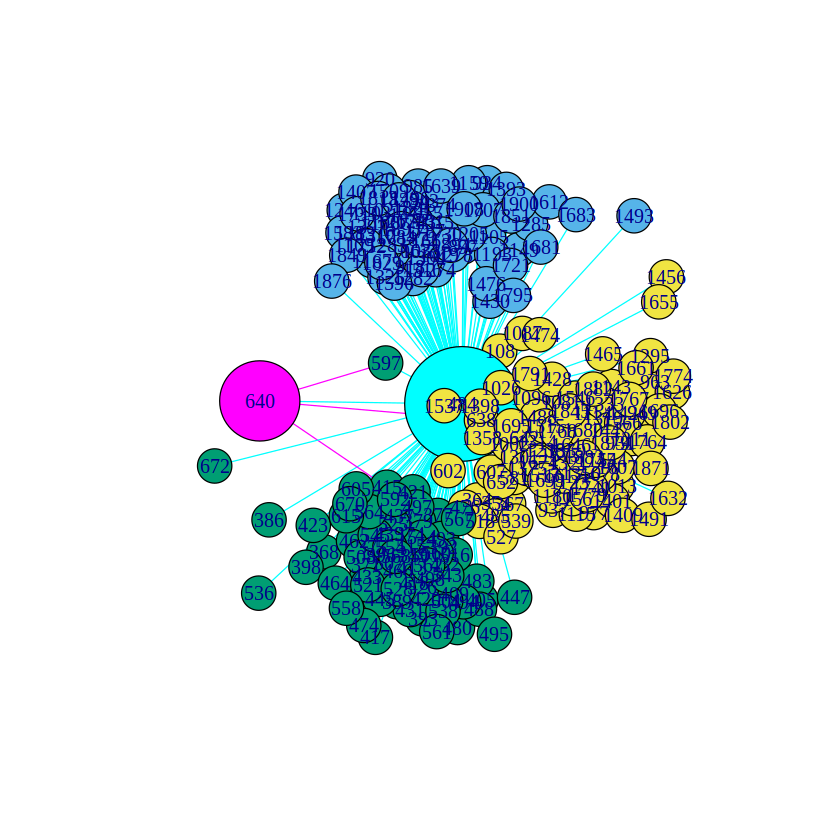

In [303]:
colorful_ego_facebook_personal_idx_484 <- ego_facebook_personal_idx_484 ##### Copy facebook
colorful_ego_facebook_personal_idx_484.com <- fgc_facebook_484 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_484)$color <- colorful_ego_facebook_personal_idx_484.com$membership + 1
max_embeddedness_ind_fgc_484 <- which.max(embeddedness_pairs_idx_484)
max_disp2emb_ind_fgc_484 <- which.max(dispersion_to_embeddedness_ratio_idx_484)

# ====================
V(colorful_ego_facebook_personal_idx_484)[max_embeddedness_ind_fgc_484]$color <- 'cyan'
print('Highest embeddedness vertex ID:')
print(V(colorful_ego_facebook_personal_idx_484)[max_embeddedness_ind_fgc_484]) ##### Print vertex with highest embeddedness
max_embeddedness_vertex_fgc_484 <- V(colorful_ego_facebook_personal_idx_484)[max_embeddedness_ind_fgc_484] ##### Save vertex with max embeddedness

V(colorful_ego_facebook_personal_idx_484)[max_disp2emb_ind_fgc_484]$color <- 'magenta'
print('Highest ratio vertex ID:')
print(V(colorful_ego_facebook_personal_idx_484)[max_disp2emb_ind_fgc_484])
max_disp2emb_vertex_fgc_484 <- V(colorful_ego_facebook_personal_idx_484)[max_disp2emb_ind_fgc_484] ##### Save vertex with max dispersion to embeddedness ratio

vertex_sizes <- rep(15,length(embeddedness_pairs_idx_484))
vertex_sizes[max_embeddedness_ind_fgc_484] <- 50 ##### Enlarge node with highest embeddedness
vertex_sizes[max_disp2emb_ind_fgc_484] <- 35 ##### Enlarge node with highest disp2emb ratio
V(colorful_ego_facebook_personal_idx_484)$size <- vertex_sizes

##### Color edges
incident_edges_max_embeddedness_vertex_fgc_484 <- incident(colorful_ego_facebook_personal_idx_484, max_embeddedness_vertex_fgc_484) ### embeddedness
incident_edges_max_emb2disp_vertex_fgc_484 <- incident(colorful_ego_facebook_personal_idx_484, max_disp2emb_vertex_fgc_484)

edges_colorful_idx_484 <- E(colorful_ego_facebook_personal_idx_484)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_484)) {
    if (edges_colorful_idx_484[i] %in% incident_edges_max_embeddedness_vertex_fgc_484) { ##### If edges are connected to node with max embeddednes
        E(colorful_ego_facebook_personal_idx_484)[i]$color <- 'cyan'
    } else if (edges_colorful_idx_484[i] %in% incident_edges_max_emb2disp_vertex_fgc_484) { ##### If edges are connected to node with max disp2emb ratio
        E(colorful_ego_facebook_personal_idx_484)[i]$color <- 'magenta'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_484))
plot(colorful_ego_facebook_personal_idx_484)

#### Q14: Node ID 1087

In [304]:
dispersion_to_embeddedness_ratio_idx_1087 <- dispersion_pairs_idx_1087 / embeddedness_pairs_idx_1087

[1] "Highest embeddedness vertex ID:"
+ 1/206 vertex, named, from 5e00ca3:
[1] 1087
[1] "Highest ratio vertex ID:"
+ 1/206 vertex, named, from 5e00ca3:
[1] 1023
Edges:  7409

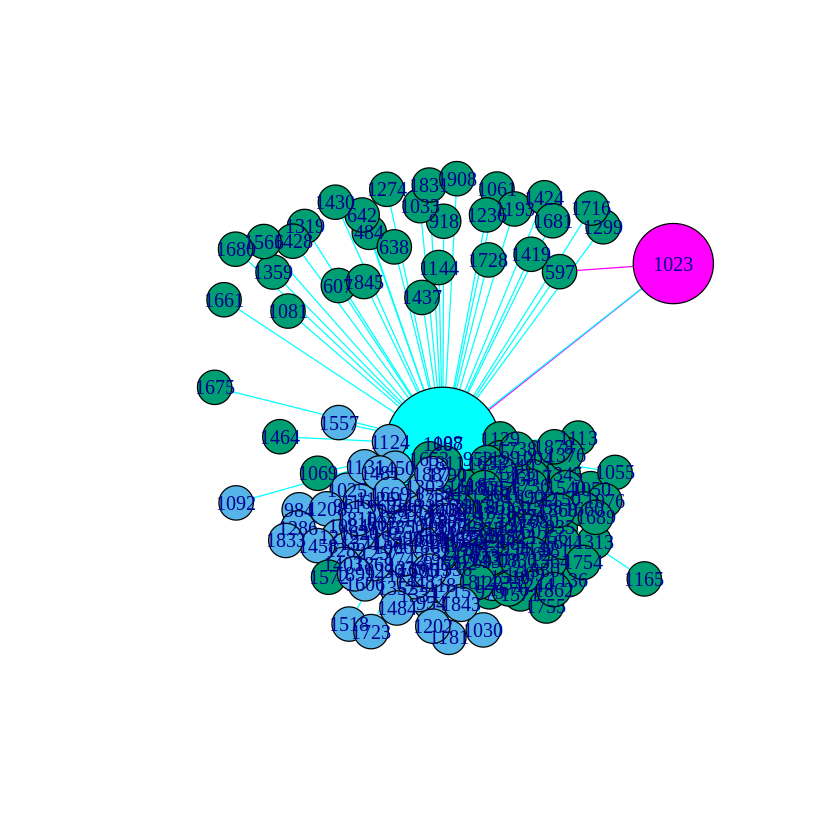

In [305]:
colorful_ego_facebook_personal_idx_1087 <- ego_facebook_personal_idx_1087 ##### Copy facebook
colorful_ego_facebook_personal_idx_1087.com <- fgc_facebook_1087 ##### Fast Greedy Community
V(colorful_ego_facebook_personal_idx_1087)$color <- colorful_ego_facebook_personal_idx_1087.com$membership + 1
max_embeddedness_ind_fgc_1087 <- which.max(embeddedness_pairs_idx_1087)
max_disp2emb_ind_fgc_1087 <- which.max(dispersion_to_embeddedness_ratio_idx_1087)

# ====================
V(colorful_ego_facebook_personal_idx_1087)[max_embeddedness_ind_fgc_1087]$color <- 'cyan'
print('Highest embeddedness vertex ID:')
print(V(colorful_ego_facebook_personal_idx_1087)[max_embeddedness_ind_fgc_1087]) ##### Print vertex with highest embeddedness
max_embeddedness_vertex_fgc_1087 <- V(colorful_ego_facebook_personal_idx_1087)[max_embeddedness_ind_fgc_1087] ##### Save vertex with max embeddedness

V(colorful_ego_facebook_personal_idx_1087)[max_disp2emb_ind_fgc_1087]$color <- 'magenta'
print('Highest ratio vertex ID:')
print(V(colorful_ego_facebook_personal_idx_1087)[max_disp2emb_ind_fgc_1087])
max_disp2emb_vertex_fgc_1087 <- V(colorful_ego_facebook_personal_idx_1087)[max_disp2emb_ind_fgc_1087] ##### Save vertex with max dispersion to embeddedness ratio

vertex_sizes <- rep(15,length(embeddedness_pairs_idx_1087))
vertex_sizes[max_embeddedness_ind_fgc_1087] <- 50 ##### Enlarge node with highest embeddedness
vertex_sizes[max_disp2emb_ind_fgc_1087] <- 35 ##### Enlarge node with highest disp2emb ratio
V(colorful_ego_facebook_personal_idx_1087)$size <- vertex_sizes

##### Color edges
incident_edges_max_embeddedness_vertex_fgc_1087 <- incident(colorful_ego_facebook_personal_idx_1087, max_embeddedness_vertex_fgc_1087) ### embeddedness
incident_edges_max_emb2disp_vertex_fgc_1087 <- incident(colorful_ego_facebook_personal_idx_1087, max_disp2emb_vertex_fgc_1087)

edges_colorful_idx_1087 <- E(colorful_ego_facebook_personal_idx_1087)
for (i in 1:ecount(colorful_ego_facebook_personal_idx_1087)) {
    if (edges_colorful_idx_1087[i] %in% incident_edges_max_embeddedness_vertex_fgc_1087) { ##### If edges are connected to node with max embeddednes
        E(colorful_ego_facebook_personal_idx_1087)[i]$color <- 'cyan'
    } else if (edges_colorful_idx_1087[i] %in% incident_edges_max_emb2disp_vertex_fgc_1087) { ##### If edges are connected to node with max disp2emb ratio
        E(colorful_ego_facebook_personal_idx_1087)[i]$color <- 'magenta'
    }
}

cat('Edges: ', ecount(colorful_ego_facebook_personal_idx_1087))
plot(colorful_ego_facebook_personal_idx_1087)

#### Q15 (Analysis Sandbox)

In [246]:
# N/A

In [247]:
neighbors(colorful_ego_facebook_personal_idx_1, max_disp2emb_vertex_fgc_1)

+ 1/348 vertex, named, from 6172a3b:
[1] 1

In [248]:
neighbors(colorful_ego_facebook_personal_idx_108, max_disp2emb_vertex_fgc_108)

+ 1/1046 vertex, named, from ab2705c:
[1] 108

In [249]:
neighbors(colorful_ego_facebook_personal_idx_349, max_disp2emb_vertex_fgc_349)

+ 1/230 vertex, named, from a387cab:
[1] 349

In [250]:
neighbors(colorful_ego_facebook_personal_idx_484, max_disp2emb_vertex_fgc_484)

+ 4/232 vertices, named, from 1e0adc7:
[1] 415 484 597 638

In [251]:
neighbors(colorful_ego_facebook_personal_idx_1087, max_disp2emb_vertex_fgc_1087)

+ 3/206 vertices, named, from 5e00ca3:
[1] 108  597  1087

### Q1-15 Sandbox

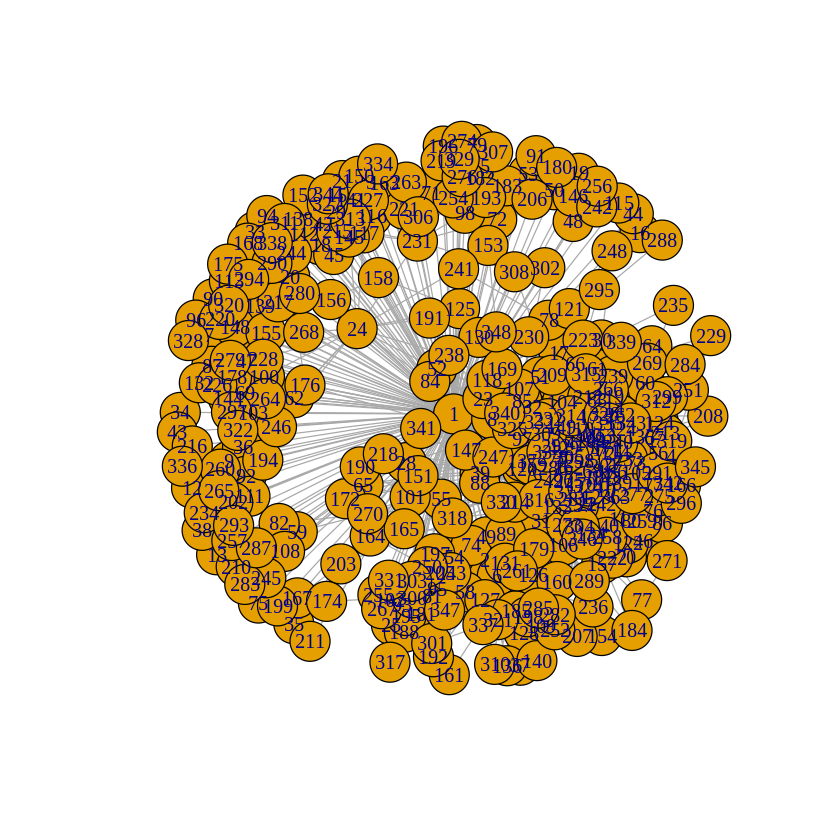

In [252]:
##### Create plot for Q5
set.seed(42)
plot(ego_facebook_personal_idx_1)

In [264]:
##### Q6
max(distances(ego_facebook_personal_idx_1))


length(ego_facebook_personal_idx_1)


[1] 2

[1] 348